# Analysis of liver ss3 data

- Import python packages 

In [1]:
import numpy as np
import scanpy as sc
import pandas as pd
import anndata as ad
import igraph
import leidenalg
import matplotlib.pyplot as plt

In [2]:
import warnings 
warnings.filterwarnings('ignore')
sc.settings.verbosity = 0 # verbosity: errors (0), warnings (1), info (2), hints (3)

In [3]:
import math

import plotly.graph_objects as go
import plotly.express
from matplotlib.pyplot import figure

!pip install adjustText
from adjustText import adjust_text

In [4]:
!pip install loompy

## Import all files (count, barcodes, metadata)

 - Import the .loom file for analysis (counts), replace with your own path for your file
 - you can rename the object as you want, this where you will store all the data and analysis

In [5]:
liver_ss3 = ad.read_loom("/Users/tgrxj/Desktop/Internship/Dana_dataset/Dana_dataset/ss3_full.loom",
                         sparse = True,
                         obs_names = 'cell names',
                         var_names = 'gene names',
                        )

In [6]:
 liver_ss3 

AnnData object with n_obs × n_vars = 5251 × 56941
    obs: 'CellID'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

## Import additional files to add information in observation layer

 - import the barcode file with cell barcode and the corresponding index


- 5251 cells and 56941 transcripts are detected

In [7]:
bc = pd.read_table("/Users/tgrxj/Desktop/Internship/Dana_dataset/Dana_dataset/Barcodes_NexteraLCL_Indexing.txt",
                   delimiter = '\t')
bc

,N7XX,N5XX,Index1,Index2,XC,XC_NovaSeq,i7loc,i7row,i7col,i5loc,i5row,i5col,BCset,WellID,XC_DNBPE
0,ATAGGCGCTC,TTGGTACGCG,GAGCGCCTAT,CGCGTACCAA,GAGCGCCTATCGCGTACCAA,GAGCGCCTATTTGGTACGCG,A1,A,1,A1,A,1,1A,A1,CGCGTACCAAATAGGCGCTC
1,TACAACCTCA,TTGGTACGCG,TGAGGTTGTA,CGCGTACCAA,TGAGGTTGTACGCGTACCAA,TGAGGTTGTATTGGTACGCG,B1,B,1,A1,A,1,1B,A1,CGCGTACCAATACAACCTCA
2,AGTTATCGGA,TTGGTACGCG,TCCGATAACT,CGCGTACCAA,TCCGATAACTCGCGTACCAA,TCCGATAACTTTGGTACGCG,C1,C,1,A1,A,1,1C,A1,CGCGTACCAAAGTTATCGGA
3,AGGAGCTTCC,TTGGTACGCG,GGAAGCTCCT,CGCGTACCAA,GGAAGCTCCTCGCGTACCAA,GGAAGCTCCTTTGGTACGCG,D1,D,1,A1,A,1,1D,A1,CGCGTACCAAAGGAGCTTCC
4,CATGCTGTTA,TTGGTACGCG,TAACAGCATG,CGCGTACCAA,TAACAGCATGCGCGTACCAA,TAACAGCATGTTGGTACGCG,E1,E,1,A1,A,1,1E,A1,CGCGTACCAACATGCTGTTA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147451,TTACCTCCTA,GTTCCTCTAA,TAGGAGGTAA,TTAGAGGAAC,TAGGAGGTAATTAGAGGAAC,TAGGAGGTAAGTTCCTCTAA,L24,L,24,P24,P,24,24L,P24,TTAGAGGAACTTACCTCCTA
147452,GATTCTCGAA,GTTCCTCTAA,TTCGAGAATC,TTAGAGGAAC,TTCGAGAATCTTAGAGGAAC,TTCGAGAATCGTTCCTCTAA,M24,M,24,P24,P,24,24M,P24,TTAGAGGAACGATTCTCGAA
147453,CTTAAGTGAC,GTTCCTCTAA,GTCACTTAAG,TTAGAGGAAC,GTCACTTAAGTTAGAGGAAC,GTCACTTAAGGTTCCTCTAA,N24,N,24,P24,P,24,24N,P24,TTAGAGGAACCTTAAGTGAC
147454,GTAGATGGTA,GTTCCTCTAA,TACCATCTAC,TTAGAGGAAC,TACCATCTACTTAGAGGAAC,TACCATCTACGTTCCTCTAA,O24,O,24,P24,P,24,24O,P24,TTAGAGGAACGTAGATGGTA


Import the plate file with information on age, sexe, replicates based on index (metadata)

In [8]:
plates = pd.read_excel("/Users/tgrxj/Desktop/Internship/Dana_dataset/Dana_dataset/plates_xpress_swati.xlsx")
plates

,Plate,Index,Age,Sex,Replicate,PlateN
0,SP_1_p1,12L,Old,Female,1,p1
1,SP_1_p2,18M,Old,Female,1,p2
2,SP_1_p3,20P,Old,Female,1,p3
3,SP_2_p1,4M,Old,Female,2,p1
4,SP_2_p2,14J,Old,Female,2,p2
5,SP_2_p3,10K,Old,Female,2,p3
6,SampleB_150322,8D,Old,Male,1,Nucleip1
7,SP_3_p1,22N,Old,Male,1,p1
8,SP_3_p2,3B,Old,Male,1,p2
9,SP_3_p3,3A,Old,Male,1,p3


## Matching the data between the different files

Change the observation column with correct CellID

In [9]:
liver_ss3.obs

,CellID
0,ss3_full:AACTGCGGAGCCATAGGTATx
1,ss3_full:AACTGCGGAGTAAGTGCTCGx
2,ss3_full:AACGTACCGTTGCCTACGTCx
3,ss3_full:AAGCGCCGAGCGATGACCTTx
4,ss3_full:AACTGCGGAGCAGCCACAAGx
...,...
5246,ss3_full:TTGTGGTTCGTTGCTCTAACx
5247,ss3_full:TTGTTACTCCAAGCCTGTTAx
5248,ss3_full:TTGTTACTCCCCTCAGAATAx
5249,ss3_full:TTGTTCGGATAAGCCTGTTAx


In [10]:
cellid = liver_ss3.obs
cellid = cellid.replace(to_replace = 'ss3_full:' , value = '', regex = True)
cellid = cellid.replace(to_replace = 'x' , value = '', regex = True)

In [11]:
cellid

,CellID
0,AACTGCGGAGCCATAGGTAT
1,AACTGCGGAGTAAGTGCTCG
2,AACGTACCGTTGCCTACGTC
3,AAGCGCCGAGCGATGACCTT
4,AACTGCGGAGCAGCCACAAG
...,...
5246,TTGTGGTTCGTTGCTCTAAC
5247,TTGTTACTCCAAGCCTGTTA
5248,TTGTTACTCCCCTCAGAATA
5249,TTGTTCGGATAAGCCTGTTA


In [12]:
liver_ss3.obs['cellid'] = cellid
liver_ss3.obs

,CellID,cellid
0,ss3_full:AACTGCGGAGCCATAGGTATx,AACTGCGGAGCCATAGGTAT
1,ss3_full:AACTGCGGAGTAAGTGCTCGx,AACTGCGGAGTAAGTGCTCG
2,ss3_full:AACGTACCGTTGCCTACGTCx,AACGTACCGTTGCCTACGTC
3,ss3_full:AAGCGCCGAGCGATGACCTTx,AAGCGCCGAGCGATGACCTT
4,ss3_full:AACTGCGGAGCAGCCACAAGx,AACTGCGGAGCAGCCACAAG
...,...,...
5246,ss3_full:TTGTGGTTCGTTGCTCTAACx,TTGTGGTTCGTTGCTCTAAC
5247,ss3_full:TTGTTACTCCAAGCCTGTTAx,TTGTTACTCCAAGCCTGTTA
5248,ss3_full:TTGTTACTCCCCTCAGAATAx,TTGTTACTCCCCTCAGAATA
5249,ss3_full:TTGTTCGGATAAGCCTGTTAx,TTGTTCGGATAAGCCTGTTA


## Join information between cell ID and age, sexe, replicates

In [13]:
# check if cellID and XC column are corresponding
# this operation only considers unique values, removing the duplicates
join_cellid = list(set(cellid.loc[:,'CellID']).intersection(bc.loc[:,'XC']))
len(join_cellid)

4993

In [14]:
# rename the BCset to INdex to merge the information between bc and plates
bc = bc.rename(columns = {'BCset':'Index'})
bc

,N7XX,N5XX,Index1,Index2,XC,XC_NovaSeq,i7loc,i7row,i7col,i5loc,i5row,i5col,Index,WellID,XC_DNBPE
0,ATAGGCGCTC,TTGGTACGCG,GAGCGCCTAT,CGCGTACCAA,GAGCGCCTATCGCGTACCAA,GAGCGCCTATTTGGTACGCG,A1,A,1,A1,A,1,1A,A1,CGCGTACCAAATAGGCGCTC
1,TACAACCTCA,TTGGTACGCG,TGAGGTTGTA,CGCGTACCAA,TGAGGTTGTACGCGTACCAA,TGAGGTTGTATTGGTACGCG,B1,B,1,A1,A,1,1B,A1,CGCGTACCAATACAACCTCA
2,AGTTATCGGA,TTGGTACGCG,TCCGATAACT,CGCGTACCAA,TCCGATAACTCGCGTACCAA,TCCGATAACTTTGGTACGCG,C1,C,1,A1,A,1,1C,A1,CGCGTACCAAAGTTATCGGA
3,AGGAGCTTCC,TTGGTACGCG,GGAAGCTCCT,CGCGTACCAA,GGAAGCTCCTCGCGTACCAA,GGAAGCTCCTTTGGTACGCG,D1,D,1,A1,A,1,1D,A1,CGCGTACCAAAGGAGCTTCC
4,CATGCTGTTA,TTGGTACGCG,TAACAGCATG,CGCGTACCAA,TAACAGCATGCGCGTACCAA,TAACAGCATGTTGGTACGCG,E1,E,1,A1,A,1,1E,A1,CGCGTACCAACATGCTGTTA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
147451,TTACCTCCTA,GTTCCTCTAA,TAGGAGGTAA,TTAGAGGAAC,TAGGAGGTAATTAGAGGAAC,TAGGAGGTAAGTTCCTCTAA,L24,L,24,P24,P,24,24L,P24,TTAGAGGAACTTACCTCCTA
147452,GATTCTCGAA,GTTCCTCTAA,TTCGAGAATC,TTAGAGGAAC,TTCGAGAATCTTAGAGGAAC,TTCGAGAATCGTTCCTCTAA,M24,M,24,P24,P,24,24M,P24,TTAGAGGAACGATTCTCGAA
147453,CTTAAGTGAC,GTTCCTCTAA,GTCACTTAAG,TTAGAGGAAC,GTCACTTAAGTTAGAGGAAC,GTCACTTAAGGTTCCTCTAA,N24,N,24,P24,P,24,24N,P24,TTAGAGGAACCTTAAGTGAC
147454,GTAGATGGTA,GTTCCTCTAA,TACCATCTAC,TTAGAGGAAC,TACCATCTACTTAGAGGAAC,TACCATCTACGTTCCTCTAA,O24,O,24,P24,P,24,24O,P24,TTAGAGGAACGTAGATGGTA


In [15]:
# merged dataset, BC and plates
merged_df = pd.merge(plates, bc, on = 'Index')
metadata = merged_df[['Plate','Index','Age','Sex','Replicate','PlateN','XC']]
metadata

,Plate,Index,Age,Sex,Replicate,PlateN,XC
0,SP_1_p1,12L,Old,Female,1,p1,CAATCGCCTACTATCACGCG
1,SP_1_p1,12L,Old,Female,1,p1,TTCTTCAAGGCTATCACGCG
2,SP_1_p1,12L,Old,Female,1,p1,TCGGTAACACCTATCACGCG
3,SP_1_p1,12L,Old,Female,1,p1,CGACATGCGTCTATCACGCG
4,SP_1_p1,12L,Old,Female,1,p1,TTACGGTAACCTATCACGCG
...,...,...,...,...,...,...,...
11515,SP_Y_M2_p3,9C,Young,Male,2,p3,GGACAGATATCCGTTCTAGA
11516,SP_Y_M2_p3,9C,Young,Male,2,p3,TCACTGTTCTCCGTTCTAGA
11517,SP_Y_M2_p3,9C,Young,Male,2,p3,TACCTATTGCCCGTTCTAGA
11518,SP_Y_M2_p3,9C,Young,Male,2,p3,TGATGGTATGCCGTTCTAGA


In [16]:
# reorder metadata based on obs of liver_ss3
metadata = metadata.set_index('XC')
metadata = metadata.reindex(index=liver_ss3.obs['cellid'])
metadata = metadata.reset_index()
metadata

,cellid,Plate,Index,Age,Sex,Replicate,PlateN
0,AACTGCGGAGCCATAGGTAT,SP_34,7E,Old,Male,2.0,p4
1,AACTGCGGAGTAAGTGCTCG,SP_34,7E,Old,Male,2.0,p4
2,AACGTACCGTTGCCTACGTC,SP_Y_M2_p2,19J,Young,Male,2.0,p2
3,AAGCGCCGAGCGATGACCTT,NaN,NaN,NaN,NaN,NaN,NaN
4,AACTGCGGAGCAGCCACAAG,SP_34,7E,Old,Male,2.0,p4
...,...,...,...,...,...,...,...
5246,TTGTGGTTCGTTGCTCTAAC,SP_3_p2,3B,Old,Male,1.0,p2
5247,TTGTTACTCCAAGCCTGTTA,SP_Y_F1_p3,7B,Young,Female,1.0,p3
5248,TTGTTACTCCCCTCAGAATA,SP_Y_F1_p3,7B,Young,Female,1.0,p3
5249,TTGTTCGGATAAGCCTGTTA,SP_34,7E,Old,Male,2.0,p4


In [17]:
liver_ss3.obs = liver_ss3.obs.set_index('cellid').join(metadata.set_index('cellid'))


In [18]:
#remove cells without metadata 
liver_ss3 = liver_ss3[list(liver_ss3.obs.dropna().index)].copy()

In [19]:
liver_ss3.obs


,CellID,Plate,Index,Age,Sex,Replicate,PlateN
cellid,,,,,,,
AACTGCGGAGCCATAGGTAT,ss3_full:AACTGCGGAGCCATAGGTATx,SP_34,7E,Old,Male,2.0,p4
AACTGCGGAGTAAGTGCTCG,ss3_full:AACTGCGGAGTAAGTGCTCGx,SP_34,7E,Old,Male,2.0,p4
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2
AACTGCGGAGCAGCCACAAG,ss3_full:AACTGCGGAGCAGCCACAAGx,SP_34,7E,Old,Male,2.0,p4
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2
...,...,...,...,...,...,...,...
TTGTGGTTCGTTGCTCTAAC,ss3_full:TTGTGGTTCGTTGCTCTAACx,SP_3_p2,3B,Old,Male,1.0,p2
TTGTTACTCCAAGCCTGTTA,ss3_full:TTGTTACTCCAAGCCTGTTAx,SP_Y_F1_p3,7B,Young,Female,1.0,p3
TTGTTACTCCCCTCAGAATA,ss3_full:TTGTTACTCCCCTCAGAATAx,SP_Y_F1_p3,7B,Young,Female,1.0,p3


In [20]:
liver_ss3.obs['Replicate']=liver_ss3.obs['Replicate'].astype('category')

In [21]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN
cellid,,,,,,,
AACTGCGGAGCCATAGGTAT,ss3_full:AACTGCGGAGCCATAGGTATx,SP_34,7E,Old,Male,2.0,p4
AACTGCGGAGTAAGTGCTCG,ss3_full:AACTGCGGAGTAAGTGCTCGx,SP_34,7E,Old,Male,2.0,p4
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2
AACTGCGGAGCAGCCACAAG,ss3_full:AACTGCGGAGCAGCCACAAGx,SP_34,7E,Old,Male,2.0,p4
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2
...,...,...,...,...,...,...,...
TTGTGGTTCGTTGCTCTAAC,ss3_full:TTGTGGTTCGTTGCTCTAACx,SP_3_p2,3B,Old,Male,1.0,p2
TTGTTACTCCAAGCCTGTTA,ss3_full:TTGTTACTCCAAGCCTGTTAx,SP_Y_F1_p3,7B,Young,Female,1.0,p3
TTGTTACTCCCCTCAGAATA,ss3_full:TTGTTACTCCCCTCAGAATAx,SP_Y_F1_p3,7B,Young,Female,1.0,p3


 - Now we have a observation layer with relevant biological information.

In [22]:
liver_ss3.var # var stands for genes/transcripts

,Accession,Chromosome,End,Gene,Start,Strand
0,ENSMUSG00000051951,1,3741721,Xkr4,3276124,-
1,ENSMUSG00000103377,1,3438772,Gm37180,3435954,-
2,ENSMUSG00000104017,1,3448011,Gm37363,3445779,-
3,ENSMUSG00000103025,1,3537508,Gm37686,3535200,-
4,ENSMUSG00000103201,1,3584730,Gm37329,3582674,-
...,...,...,...,...,...,...
56936,ENSMUSG00000100533,Y,90288770,Gm29504,90286493,+
56937,ENSMUSG00000096178,Y,90444532,Gm20837,90412517,+
56938,ENSMUSG00000095134,Y,90774754,Mid1-ps1,90764326,+
56939,ENSMUSG00000096768,Y,90827734,Gm47283,90796007,+


# Preprocessing

Genes that yield the highest fraction of counts in each single cell, across all cells.

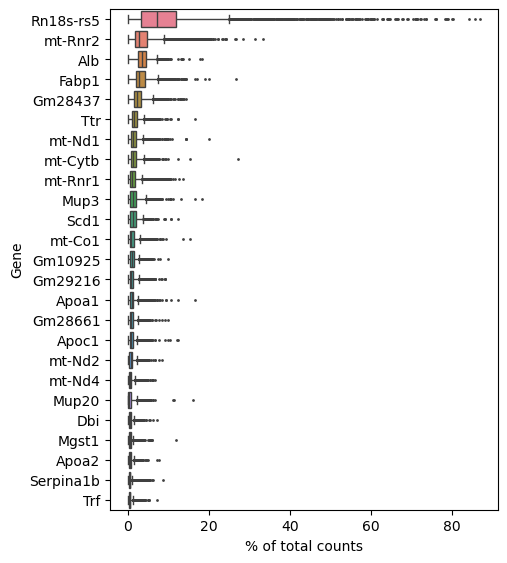

In [23]:
liver_ss3.var_names = liver_ss3.var['Gene']
sc.pl.highest_expr_genes(liver_ss3, n_top=25)

In [24]:
import scanpy as sc
print(sc.__version__)

1.10.1


In [25]:
import scanpy as sc
from scanpy import preprocessing as pp 

#### Filtering

In [26]:
pp.filter_cells(liver_ss3, min_genes=800)
pp.filter_genes(liver_ss3, min_cells=10)

filtered out genes that are detected in less than 10 cells

In [27]:
liver_ss3

AnnData object with n_obs × n_vars = 3018 × 15442
    obs: 'CellID', 'Plate', 'Index', 'Age', 'Sex', 'Replicate', 'PlateN', 'n_genes'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand', 'n_cells'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

In [28]:
liver_ss3.var

,Accession,Chromosome,End,Gene,Start,Strand,n_cells
Gene,,,,,,,
Gm37381,ENSMUSG00000102343,1,4056438,Gm37381,3975962,-,31
Gm6085,ENSMUSG00000098104,1,4759626,Gm6085,4758157,-,29
Mrpl15,ENSMUSG00000033845,1,4855962,Mrpl15,4843429,-,2301
Gm57122,ENSMUSG00000120372,1,7159048,Gm57122,7158447,-,27
Gm26901,ENSMUSG00000097797,1,7468093,Gm26901,7419630,-,22
...,...,...,...,...,...,...,...
Eif2s3y,ENSMUSG00000069049,Y,1028847,Eif2s3y,1010543,+,1252
Gm29650,ENSMUSG00000099876,Y,1049134,Gm29650,1048393,+,22
Gapdh-ps15,ENSMUSG00000096438,Y,38576129,Gapdh-ps15,38575128,+,469


In [29]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN,n_genes
cellid,,,,,,,,
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,2514
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2,3421
AACGTACCGTGAATAGACCA,ss3_full:AACGTACCGTGAATAGACCAx,SP_2_p2,14J,Old,Female,2.0,p2,2949
AACGTACCGTGGAGATTGAA,ss3_full:AACGTACCGTGGAGATTGAAx,SP_2_p2,14J,Old,Female,2.0,p2,1312
AACGTACCGTCCGTATCATA,ss3_full:AACGTACCGTCCGTATCATAx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,6871
...,...,...,...,...,...,...,...,...
TTGTTACTCCTAAGTGCTCG,ss3_full:TTGTTACTCCTAAGTGCTCGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,4021
TTGTTACTCCTTGTGTCTTC,ss3_full:TTGTTACTCCTTGTGTCTTCx,SP_3_p2,3B,Old,Male,1.0,p2,3275
TTGTTACTCCGTGTTCCACG,ss3_full:TTGTTACTCCGTGTTCCACGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,5820


In [30]:
raw_matrix=liver_ss3.X

High proportions are indicative of poor-quality cells, possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane.

In [31]:
# annotate the group of mitochondrial genes as 'mt'
liver_ss3.var['mt'] = liver_ss3.var_names.str.startswith('mt-')
sc.pp.calculate_qc_metrics(liver_ss3, qc_vars = ['mt'], 
                        percent_top = None, 
                        log1p = False,
                        inplace = True,
                       )
                        

A violin plot of some of the computed quality measures:

-the number of genes expressed in the count matrix

-the total counts per cell

-the percentage of counts in mitochondrial genes

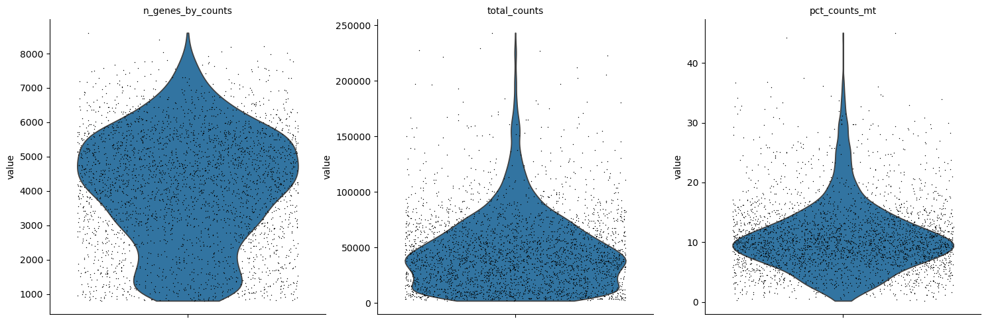

In [32]:
liver_ss3.var_names_make_unique()
#identify potentially problematic cells
sc.pl.violin(liver_ss3, 
             ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
             jitter = 0.4,
             multi_panel = True,
            )

This plot helps identify cells with unusually high mitochondrial gene expression.
High mitochondrial counts can indicate cell stress or death (apoptosis), as damaged cells release more mitochondrial RNA.Cells with high total counts and high mitochondrial gene percentage might be low-quality cells or doublets (two cells in one droplet), potentially indicating sequencing artifacts or technical errors.

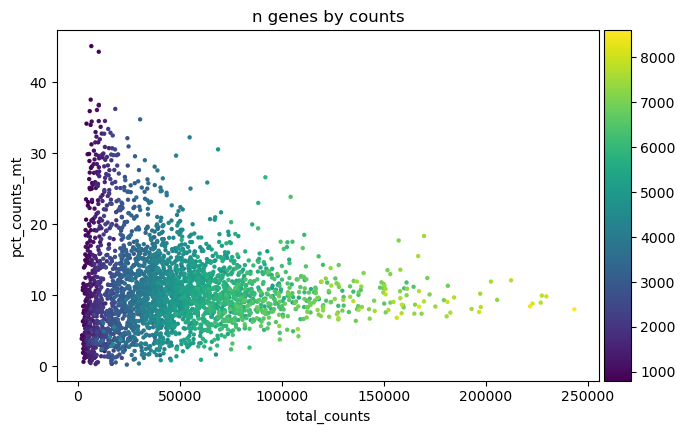

In [33]:
sc.pl.scatter(liver_ss3, x='total_counts', y='pct_counts_mt', color='n_genes_by_counts')


This plot helps identify cells with low gene diversity (fewer unique genes),
suggesting low-quality cells or technical issues. A low number of genes might 
indicate empty droplets, stressed cells, or other problems.
Cells with high total counts but a low number of unique 
genes might be technical artifacts or doublets, as they 
can contain more RNA without a corresponding increase in gene diversity.
A healthy scRNA-seq dataset often shows a positive correlation between 
total counts and the number of unique genes. Outliers, such as cells 
with high counts but few genes or vice versa, can indicate problems.

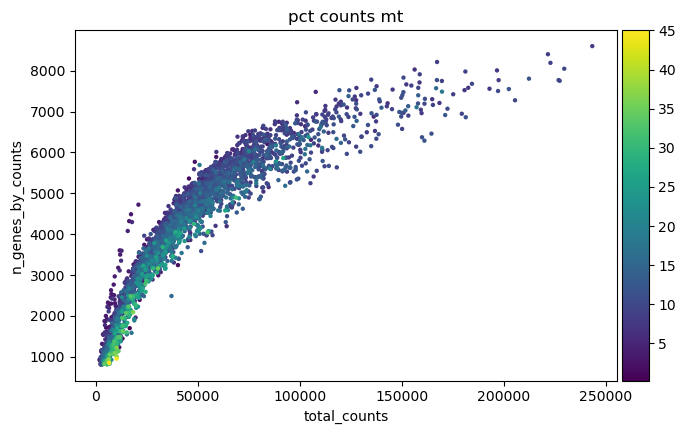

In [34]:
sc.pl.scatter(liver_ss3, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt')


In [35]:
upper_limit = np.quantile(liver_ss3.obs.n_genes_by_counts, 0.98)
upper_limit

7187.859999999997

In [36]:
liver_ss3 = liver_ss3[liver_ss3.obs.n_genes_by_counts < upper_limit, :]
liver_ss3 = liver_ss3[liver_ss3.obs.pct_counts_mt < 25, :].copy()

- removed cells with more than 7187 genes
- removed > 25% mitochondrial count

In [37]:
raw_matrix=liver_ss3.X 

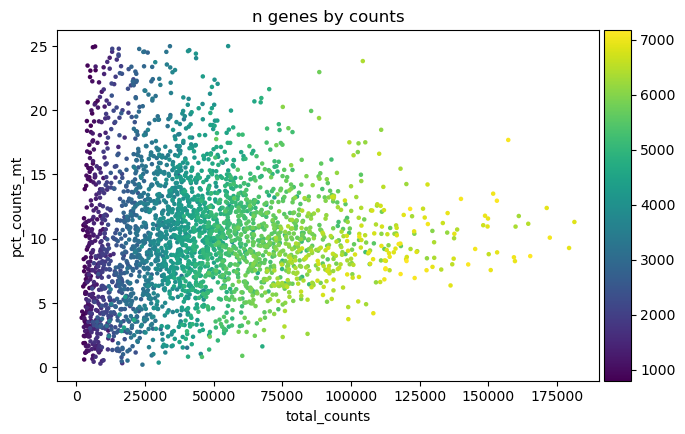

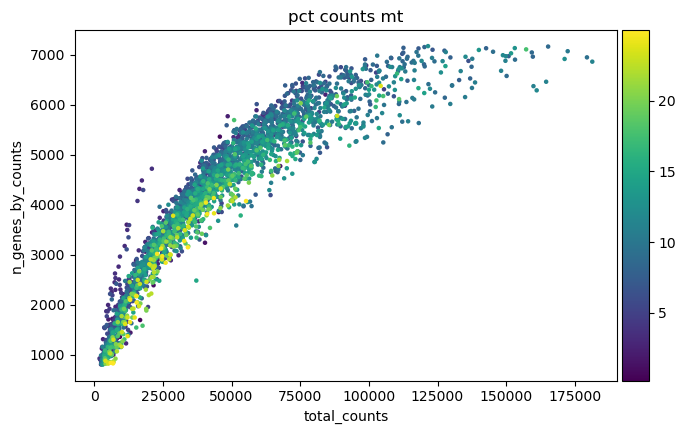

In [38]:
sc.pl.scatter(liver_ss3, x='total_counts', y='pct_counts_mt', color='n_genes_by_counts')
sc.pl.scatter(liver_ss3, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt')

In [39]:
liver_ss3.X.sum(axis = 1)

matrix([[22719.],
        [39147.],
        [24865.],
        ...,
        [65542.],
        [27258.],
        [40318.]], dtype=float32)

In [40]:
liver_ss3.X


<2847x15442 sparse matrix of type '<class 'numpy.float32'>'
	with 11755971 stored elements in Compressed Sparse Row format>

In [41]:
liver_ss3.raw = liver_ss3

In [42]:
liver_ss3.layers["raw"]=raw_matrix

In [43]:
liver_ss3.layers['raw'].max()

19498.0

In [44]:
liver_ss3

AnnData object with n_obs × n_vars = 2847 × 15442
    obs: 'CellID', 'Plate', 'Index', 'Age', 'Sex', 'Replicate', 'PlateN', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'raw'

- Total-count normalize (library-size correct) the data matrix 
 to 10,000 reads per cell, so that counts become comparable among cells.

In [45]:
sc.pp.normalize_total(liver_ss3, target_sum = 1e4)

In [46]:
liver_ss3.X.sum(axis = 1)

matrix([[10000.   ],
        [10000.001],
        [10000.   ],
        ...,
        [10000.   ],
        [ 9999.999],
        [10000.   ]], dtype=float32)

- Logarithmize the data:

In [47]:
sc.pp.log1p(liver_ss3)

In [48]:
liver_ss3.X.sum(axis = 1)

matrix([[2155.5076],
        [2093.4417],
        [2534.3337],
        ...,
        [3184.176 ],
        [2841.8372],
        [2849.9768]], dtype=float32)

In [49]:
#finding highly variable genes
sc.pp.highly_variable_genes(liver_ss3, min_mean = 0.0125, max_mean = 3, min_disp = 0.5)

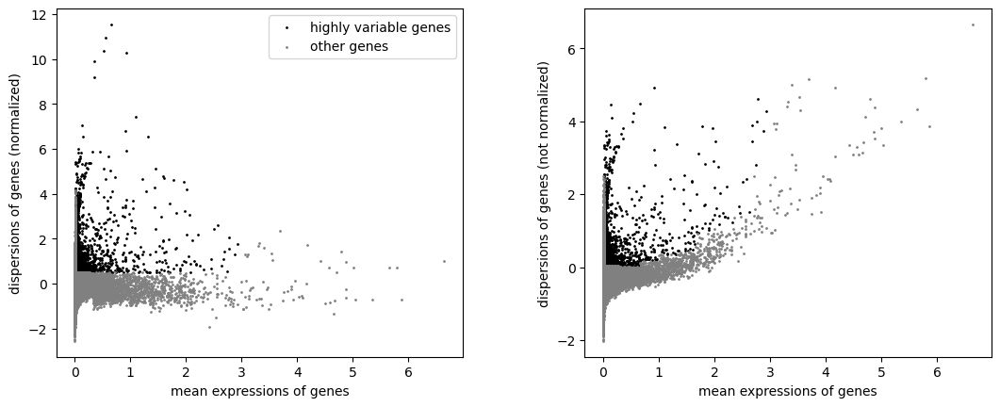

In [50]:
sc.pl.highly_variable_genes(liver_ss3)

In [51]:
liver_ss3 = liver_ss3[:, liver_ss3.var.highly_variable]
liver_ss3

View of AnnData object with n_obs × n_vars = 2847 × 1900
    obs: 'CellID', 'Plate', 'Index', 'Age', 'Sex', 'Replicate', 'PlateN', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'raw'

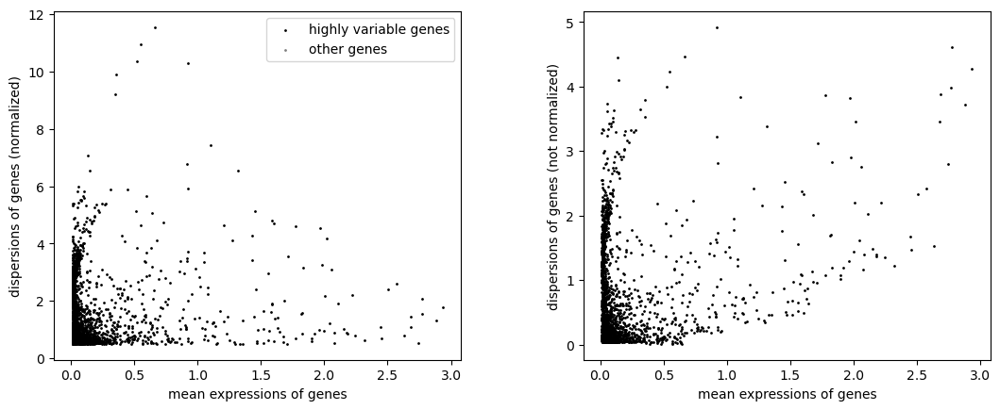

In [52]:
sc.pl.highly_variable_genes(liver_ss3)

- Regress out effects of total counts per cell and the percentage of mitochondrial genes expressed. Scale the data to unit variance.

In [53]:
sc.pp.regress_out(liver_ss3, ['total_counts', 'pct_counts_mt'])

- Scale each gene to unit variance. Clip values exceeding standard deviation 10.

In [54]:
sc.pp.scale(liver_ss3, max_value = 10)

## Principal component analysis
Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data.

In [55]:
sc.tl.pca(liver_ss3, svd_solver = "arpack")

Inspect the contribution of single PCs to the total variance in the data. This gives information about how many PCs should be considered in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.umap(). 

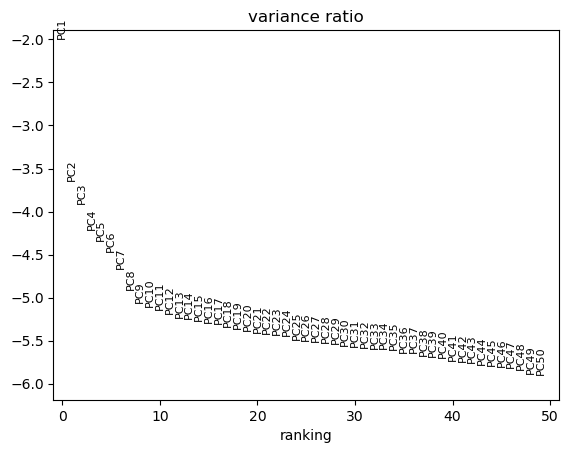

In [56]:
sc.pl.pca_variance_ratio(liver_ss3, log = True, n_pcs = 50)

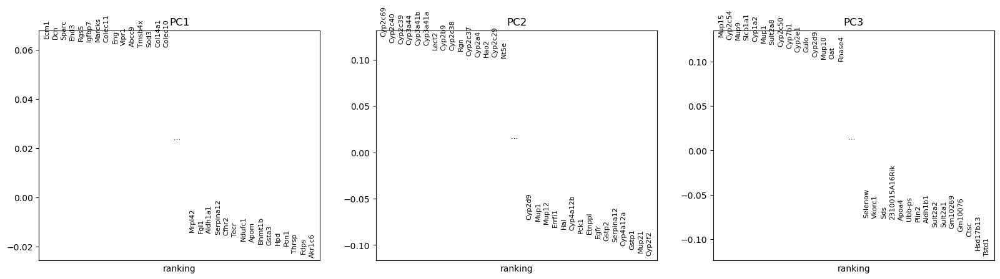

In [57]:
sc.pl.pca_loadings(liver_ss3)

## Computing the neighborhood graph
Compute the neighborhood graph of cells using the PCA representation of the data matrix. 

In [58]:
sc.pp.neighbors(liver_ss3, n_pcs = 15)

## Embedding the neighborhood graph
Embed the graph in two dimensions using UMAP. It is potentially more faithful and it better preserves trajectories. 

In [59]:
sc.tl.umap(liver_ss3)

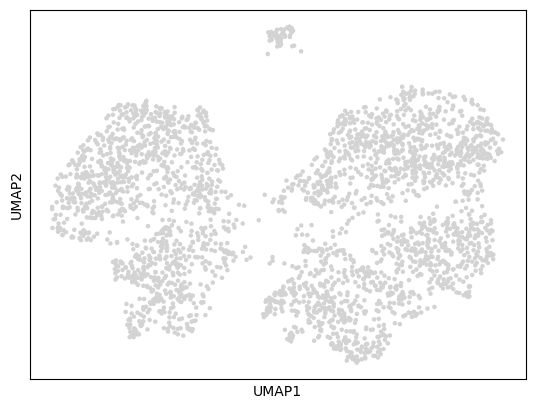

In [60]:
sc.pl.umap(liver_ss3)

## Clustering the neighborhood graph
Leiden clustering directly clusters the neighborhood graph of cells, which were already computed in the previous section.

In [61]:
sc.tl.leiden(liver_ss3, resolution = 0.5)

In [62]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
cellid,,,,,,,,,,,,,
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,2514,2513,22719.0,992.0,4.366389,0
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2,3421,3419,39147.0,7553.0,19.293943,0
AACGTACCGTGAATAGACCA,ss3_full:AACGTACCGTGAATAGACCAx,SP_2_p2,14J,Old,Female,2.0,p2,2949,2948,24865.0,890.0,3.579328,3
AACGTACCGTGGAGATTGAA,ss3_full:AACGTACCGTGGAGATTGAAx,SP_2_p2,14J,Old,Female,2.0,p2,1312,1312,5596.0,264.0,4.717656,3
AACGTACCGTCCGTATCATA,ss3_full:AACGTACCGTCCGTATCATAx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,6871,6839,116682.0,11986.0,10.272365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTACTCCTAAGTGCTCG,ss3_full:TTGTTACTCCTAAGTGCTCGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,4021,4015,36888.0,4544.0,12.318369,2
TTGTTACTCCTTGTGTCTTC,ss3_full:TTGTTACTCCTTGTGTCTTCx,SP_3_p2,3B,Old,Male,1.0,p2,3275,3271,24552.0,3328.0,13.554904,6
TTGTTACTCCGTGTTCCACG,ss3_full:TTGTTACTCCGTGTTCCACGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,5820,5796,65542.0,5396.0,8.232888,2


In [63]:
liver_ss3.uns

OrderedDict([('log1p', {'base': None}),
             ('hvg', {'flavor': 'seurat'}),
             ('pca',
              {'params': {'zero_center': True,
                'use_highly_variable': True,
                'mask_var': 'highly_variable'},
               'variance': array([216.1889875 ,  41.45189767,  31.85868558,  23.54367089,
                       20.74213177,  18.19515418,  14.93609732,  11.61418935,
                       10.05726478,   9.53157249,   9.23591718,   8.8370437 ,
                        8.47153104,   8.34263767,   8.14518101,   7.91499102,
                        7.86772749,   7.60706453,   7.39522677,   7.22240705,
                        7.05646295,   7.03368823,   6.91071265,   6.81233568,
                        6.50572307,   6.43397115,   6.34959575,   6.33035563,
                        6.23412339,   6.08267931,   6.00199219,   5.9663331 ,
                        5.90999818,   5.88115661,   5.78254796,   5.58844152,
                        5.58226287,   5.4

In [64]:
sc.set_figure_params(figsize=(5, 5))

In [65]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden
cellid,,,,,,,,,,,,,
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,2514,2513,22719.0,992.0,4.366389,0
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2,3421,3419,39147.0,7553.0,19.293943,0
AACGTACCGTGAATAGACCA,ss3_full:AACGTACCGTGAATAGACCAx,SP_2_p2,14J,Old,Female,2.0,p2,2949,2948,24865.0,890.0,3.579328,3
AACGTACCGTGGAGATTGAA,ss3_full:AACGTACCGTGGAGATTGAAx,SP_2_p2,14J,Old,Female,2.0,p2,1312,1312,5596.0,264.0,4.717656,3
AACGTACCGTCCGTATCATA,ss3_full:AACGTACCGTCCGTATCATAx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,6871,6839,116682.0,11986.0,10.272365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTACTCCTAAGTGCTCG,ss3_full:TTGTTACTCCTAAGTGCTCGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,4021,4015,36888.0,4544.0,12.318369,2
TTGTTACTCCTTGTGTCTTC,ss3_full:TTGTTACTCCTTGTGTCTTCx,SP_3_p2,3B,Old,Male,1.0,p2,3275,3271,24552.0,3328.0,13.554904,6
TTGTTACTCCGTGTTCCACG,ss3_full:TTGTTACTCCGTGTTCCACGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,5820,5796,65542.0,5396.0,8.232888,2


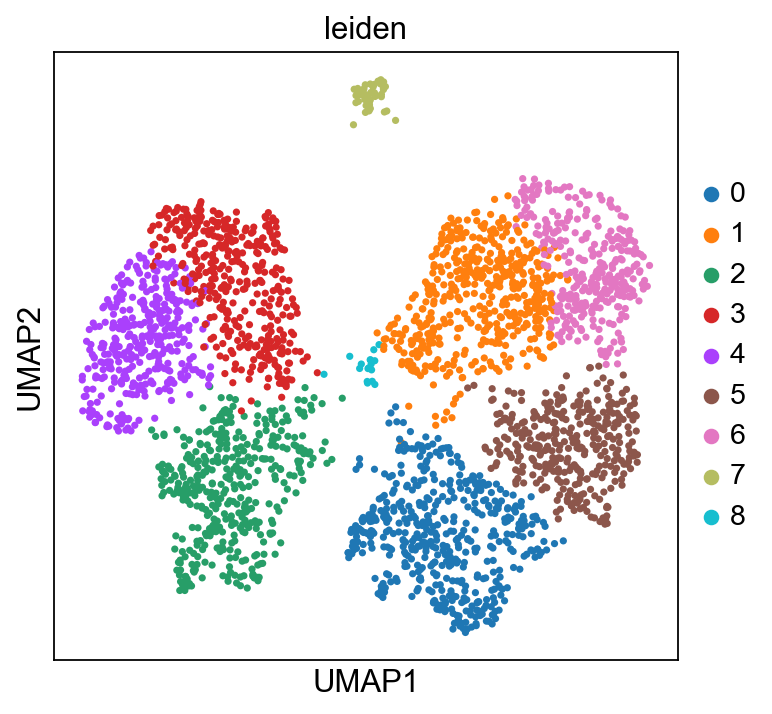

In [66]:
sc.pl.umap(liver_ss3, color = ['leiden'])

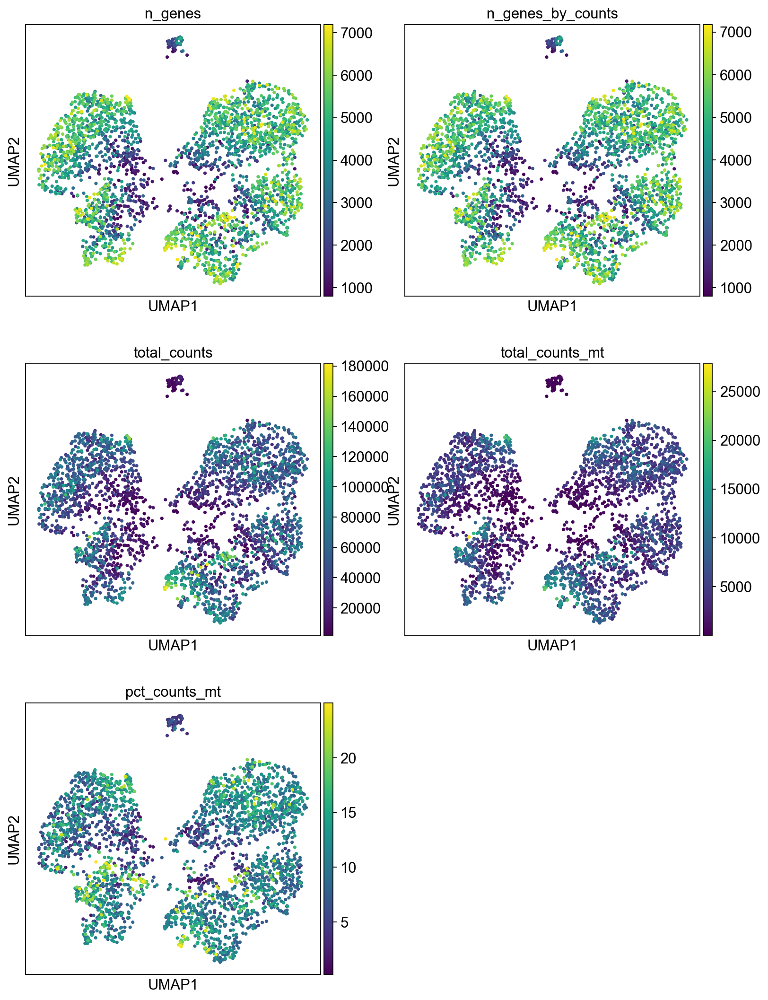

In [67]:
import seaborn as sns
colorblind_palette = sns.color_palette("tab10")
sc.pl.umap(liver_ss3, color = ['n_genes', 'n_genes_by_counts','total_counts', 'total_counts_mt', 'pct_counts_mt'], palette=colorblind_palette, ncols =2 )

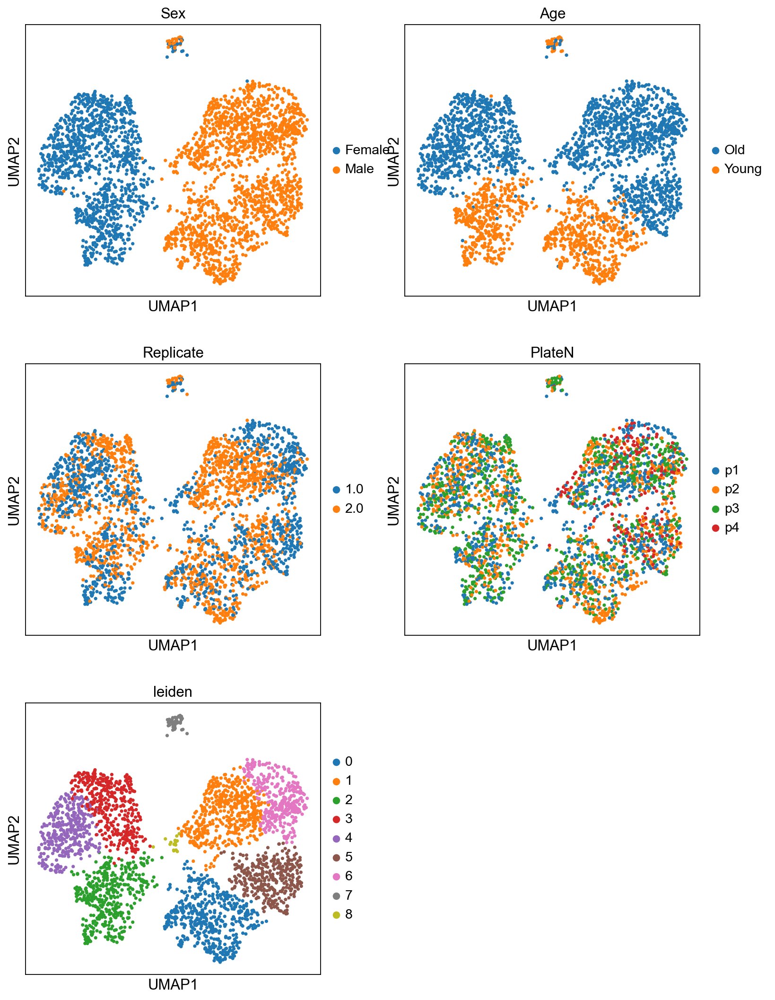

In [68]:
import seaborn as sns
colorblind_palette = sns.color_palette("tab10")
sc.pl.umap(liver_ss3, color = ['Sex', 'Age','Replicate', 'PlateN', 'leiden'], palette=colorblind_palette, ncols =2)

- comparing the most expressed genes in each clusters against any other cluster

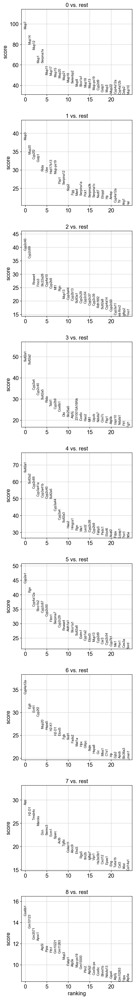

In [69]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', method='t-test', key_added = "t-test")
sc.pl.rank_genes_groups(liver_ss3, n_genes=25, sharey=False, key = "t-test", ncols=1)

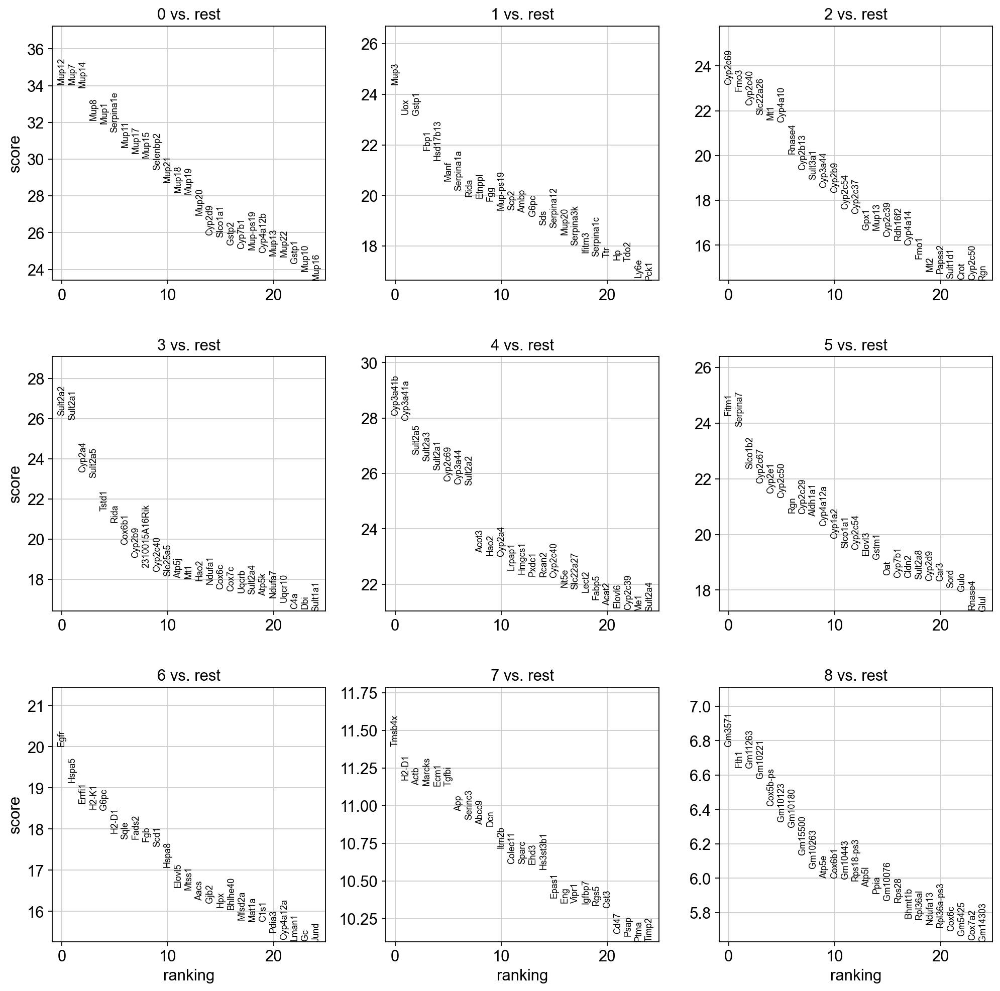

In [70]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(liver_ss3, n_genes=25, sharey=False, key = "wilcoxon", ncols=3)

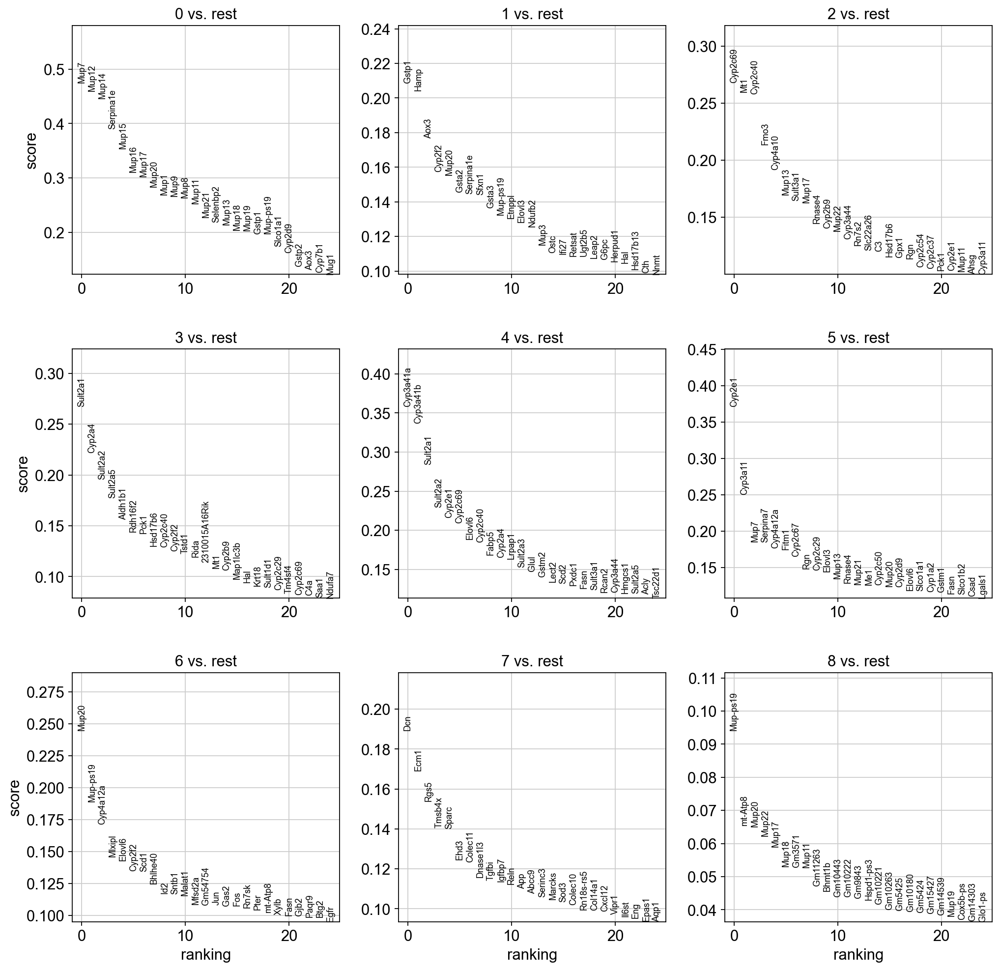

In [71]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', method='logreg')
sc.pl.rank_genes_groups(liver_ss3, n_genes=25, sharey=False, ncols=3)

In [72]:
print(liver_ss3.obs['leiden'].unique())

['0', '3', '1', '6', '5', '4', '2', '7', '8']
Categories (9, object): ['0', '1', '2', '3', ..., '5', '6', '7', '8']


In [73]:
def annotate_clusters(row):
    cluster_id = int(row['leiden'])  
    age = 'old' if cluster_id not in [0, 2] else 'young'
    sex = 'female' if cluster_id in [2, 3, 4] else 'male'
    cell_type = 'Kupffer' if cluster_id == 7 else 'hep'
    
    if cell_type == 'Kupffer':
        return f'{cell_type} cells'
    else:
        return f'{age} {sex} {cell_type}'

In [74]:
liver_ss3.obs['Annotated Cluster'] = liver_ss3.obs.apply(annotate_clusters, axis = 1)

In [75]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,Annotated Cluster
cellid,,,,,,,,,,,,,,
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,2514,2513,22719.0,992.0,4.366389,0,young male hep
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2,3421,3419,39147.0,7553.0,19.293943,0,young male hep
AACGTACCGTGAATAGACCA,ss3_full:AACGTACCGTGAATAGACCAx,SP_2_p2,14J,Old,Female,2.0,p2,2949,2948,24865.0,890.0,3.579328,3,old female hep
AACGTACCGTGGAGATTGAA,ss3_full:AACGTACCGTGGAGATTGAAx,SP_2_p2,14J,Old,Female,2.0,p2,1312,1312,5596.0,264.0,4.717656,3,old female hep
AACGTACCGTCCGTATCATA,ss3_full:AACGTACCGTCCGTATCATAx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,6871,6839,116682.0,11986.0,10.272365,0,young male hep
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTACTCCTAAGTGCTCG,ss3_full:TTGTTACTCCTAAGTGCTCGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,4021,4015,36888.0,4544.0,12.318369,2,young female hep
TTGTTACTCCTTGTGTCTTC,ss3_full:TTGTTACTCCTTGTGTCTTCx,SP_3_p2,3B,Old,Male,1.0,p2,3275,3271,24552.0,3328.0,13.554904,6,old male hep
TTGTTACTCCGTGTTCCACG,ss3_full:TTGTTACTCCGTGTTCCACGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,5820,5796,65542.0,5396.0,8.232888,2,young female hep


In [76]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['0','1'], reference='2', method='wilcoxon', use_raw = True)
moc_res = liver_ss3.uns['rank_genes_groups']
groups = moc_res['names'].dtype.names
moc_degs = pd.DataFrame(
    {group + '_' + key: moc_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})

In [77]:
liver_ss3

AnnData object with n_obs × n_vars = 2847 × 1900
    obs: 'CellID', 'Plate', 'Index', 'Age', 'Sex', 'Replicate', 'PlateN', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'Annotated Cluster'
    var: 'Accession', 'Chromosome', 'End', 'Gene', 'Start', 'Strand', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Sex_colors', 'Age_colors', 'Replicate_colors', 'PlateN_colors', 't-test', 'wilcoxon', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced', 'raw'
    obsp: 'distances', 'connectivities'

In [78]:
moc_degs

,0_names,0_scores,0_pvals,0_pvals_adj,0_logfoldchanges,1_names,1_scores,1_pvals,1_pvals_adj,1_logfoldchanges
0,Mup20,25.659672,3.297813e-145,5.092483e-141,7.095884,Mup20,25.382334,3.952221e-142,6.103020e-138,6.298646
1,Mup12,25.410112,1.949726e-142,1.431203e-138,5.860667,Mup-ps19,25.226234,2.065224e-140,1.594559e-136,6.393817
2,Mup7,25.396162,2.780476e-142,1.431203e-138,5.387271,Gstp1,24.740681,3.905947e-135,1.206313e-131,3.185727
3,Mup21,25.232761,1.751198e-140,6.760498e-137,5.738623,Cyp4a12a,24.674576,2.005387e-134,5.161198e-131,7.025454
4,Mup-ps19,25.215969,2.676571e-140,8.266322e-137,7.115741,Serpina12,23.759087,8.851032e-125,1.952538e-121,3.175414
...,...,...,...,...,...,...,...,...,...,...
15437,Cyp2a4,-21.779894,3.599075e-105,2.416388e-102,-6.549726,Rgn,-22.467949,8.544871e-112,1.099582e-108,-2.991950
15438,Mt1,-23.070440,9.172635e-118,7.869102e-115,-5.970092,Cyp2c29,-22.958147,1.221700e-116,1.886549e-113,-3.958342
15439,Cyp2b9,-23.395693,4.727623e-121,4.562747e-118,-7.445979,Rnase4,-23.298752,4.564268e-120,7.831270e-117,-3.447383
15440,Cyp2c69,-24.910221,5.765670e-137,9.892609e-134,-6.327273,Cyp2c69,-24.788200,1.201752e-135,4.639364e-132,-6.914389


## Annotation 

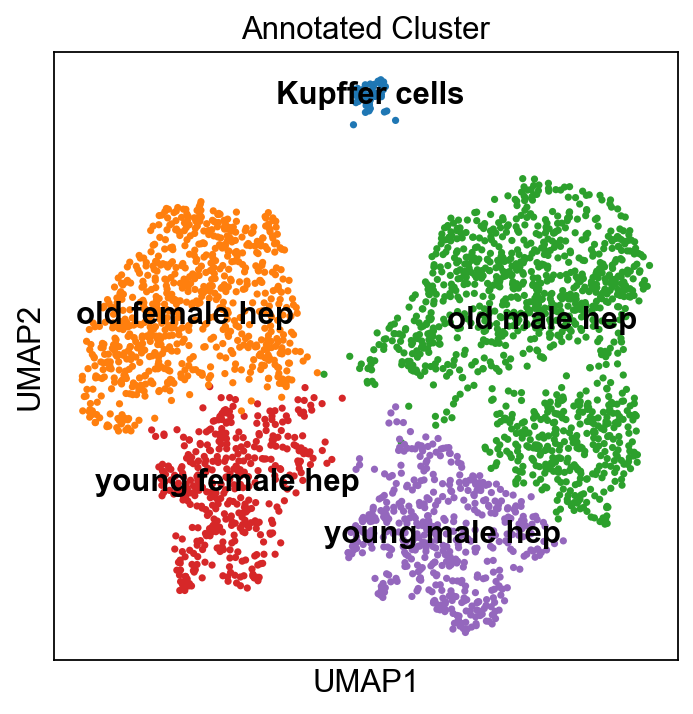

In [79]:
sc.pl.umap(liver_ss3, color = ['Annotated Cluster'],  legend_loc='on data',palette=colorblind_palette)


In [80]:
def annotate(row):
    cluster_id = int(row['leiden'])  
    
    age = 'O' if cluster_id not in [0, 2] else 'Y'
    
    sex = 'F' if cluster_id in [2, 3, 4] else 'M'
    
    if cluster_id == 7:
        cell_type = 'endothelial'
    elif cluster_id in [ 0, 3, 5]:
        cell_type = 'pericentral hep'
    elif cluster_id in [1, 2, 4, 6, 8]:
        cell_type = 'periportal hep'
    else:
        cell_type = 'hep'
    
    if cell_type == 'endothelial':
        return f'{cell_type} cells'
    else:
        return f'{age}{sex} {cell_type}'

In [81]:
liver_ss3.obs['CV & PV'] = liver_ss3.obs.apply(annotate, axis = 1)

In [82]:
liver_ss3.obs

,CellID,Plate,Index,Age,Sex,Replicate,PlateN,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,leiden,Annotated Cluster,CV & PV
cellid,,,,,,,,,,,,,,,
AACGTACCGTTGCCTACGTC,ss3_full:AACGTACCGTTGCCTACGTCx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,2514,2513,22719.0,992.0,4.366389,0,young male hep,YM pericentral hep
AACTGCGCCATGGACGGAGT,ss3_full:AACTGCGCCATGGACGGAGTx,SP_Y_M1_p2,10G,Young,Male,1.0,p2,3421,3419,39147.0,7553.0,19.293943,0,young male hep,YM pericentral hep
AACGTACCGTGAATAGACCA,ss3_full:AACGTACCGTGAATAGACCAx,SP_2_p2,14J,Old,Female,2.0,p2,2949,2948,24865.0,890.0,3.579328,3,old female hep,OF pericentral hep
AACGTACCGTGGAGATTGAA,ss3_full:AACGTACCGTGGAGATTGAAx,SP_2_p2,14J,Old,Female,2.0,p2,1312,1312,5596.0,264.0,4.717656,3,old female hep,OF pericentral hep
AACGTACCGTCCGTATCATA,ss3_full:AACGTACCGTCCGTATCATAx,SP_Y_M2_p2,19J,Young,Male,2.0,p2,6871,6839,116682.0,11986.0,10.272365,0,young male hep,YM pericentral hep
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTACTCCTAAGTGCTCG,ss3_full:TTGTTACTCCTAAGTGCTCGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,4021,4015,36888.0,4544.0,12.318369,2,young female hep,YF periportal hep
TTGTTACTCCTTGTGTCTTC,ss3_full:TTGTTACTCCTTGTGTCTTCx,SP_3_p2,3B,Old,Male,1.0,p2,3275,3271,24552.0,3328.0,13.554904,6,old male hep,OM periportal hep
TTGTTACTCCGTGTTCCACG,ss3_full:TTGTTACTCCGTGTTCCACGx,SP_Y_F1_p3,7B,Young,Female,1.0,p3,5820,5796,65542.0,5396.0,8.232888,2,young female hep,YF periportal hep


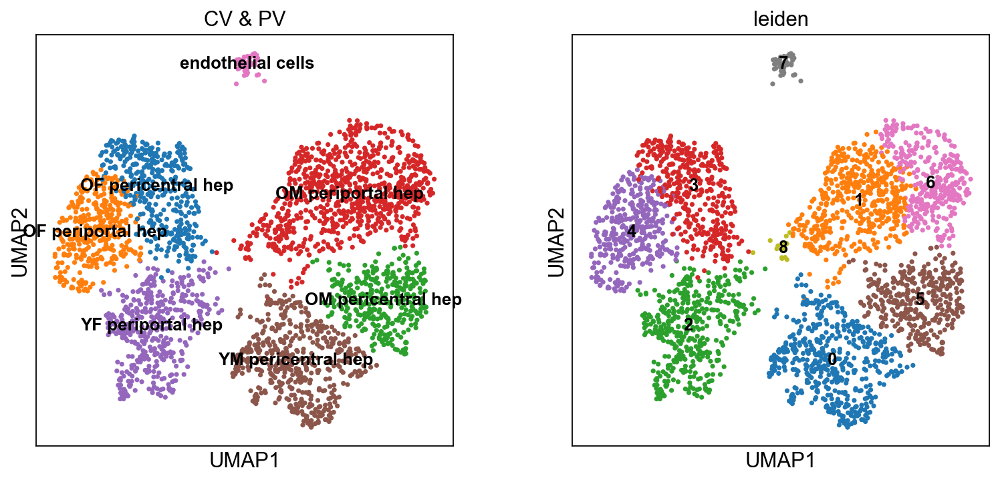

In [83]:
sc.pl.umap(liver_ss3, color=['CV & PV', "leiden"], palette=colorblind_palette, legend_loc='on data', legend_fontsize='small')


In [84]:
def combine_annotations(row):
    return f"{row['leiden']}_{row['CV & PV']}"

In [85]:
liver_ss3.obs['Hep. subtypes annotation'] = liver_ss3.obs.apply(combine_annotations, axis=1)

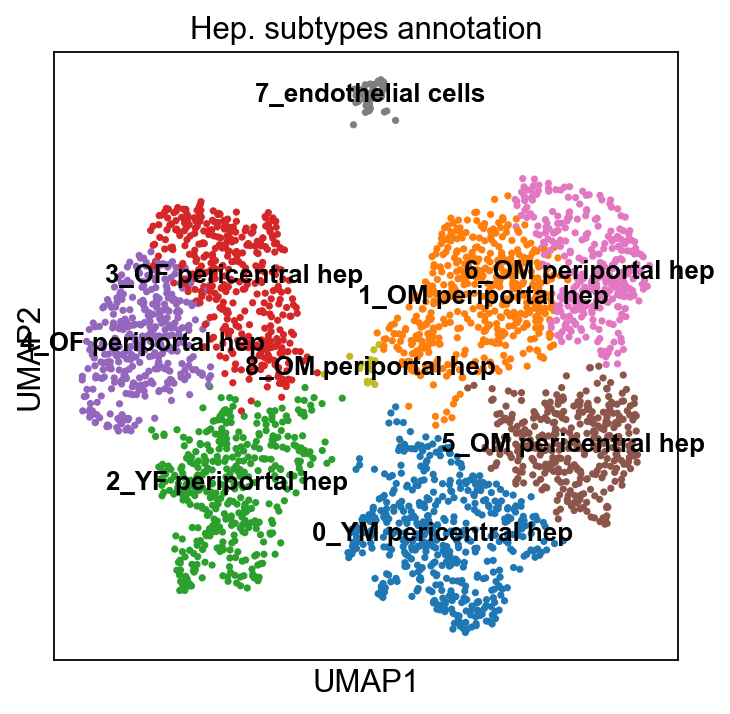

In [86]:
sc.pl.umap(liver_ss3, color='Hep. subtypes annotation', palette=colorblind_palette, legend_loc='on data', legend_fontsize='small')

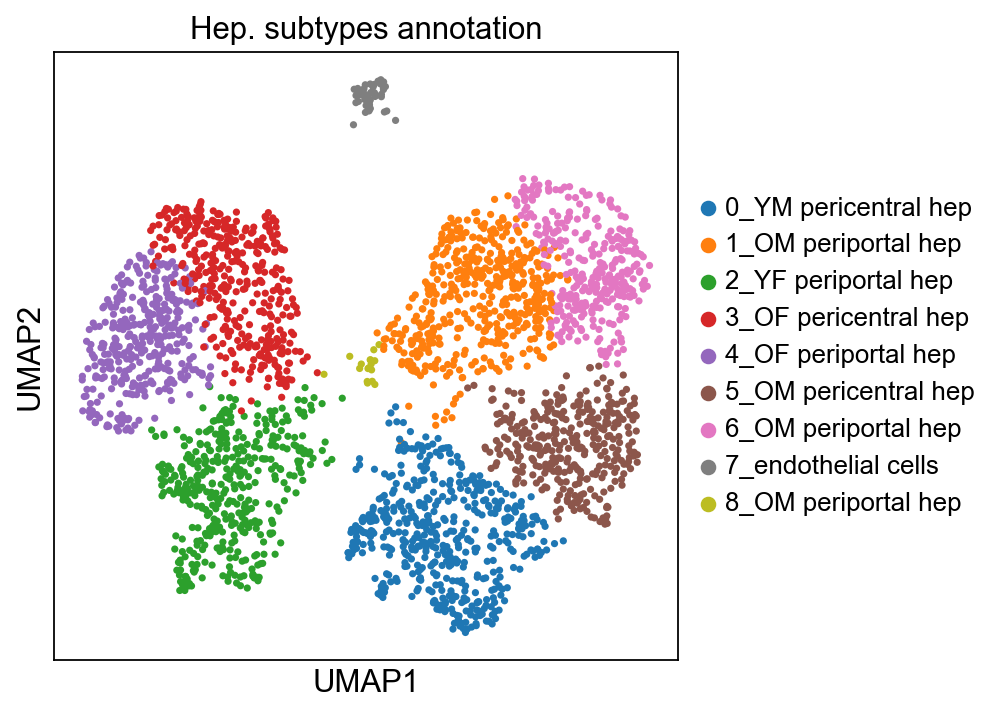

In [87]:
sc.pl.umap(liver_ss3, color='Hep. subtypes annotation', palette=colorblind_palette, legend_fontsize='small')

### Comparing the gene expression of old male pericentral hepatocytes(cluster 5) against old male periportal hepatocytes (cluster 1,6 and 8)
The questions I am trying to answer are:
 - How does old age affect male periportal and pericentral hepatocytes?
 - What functions are affected? 

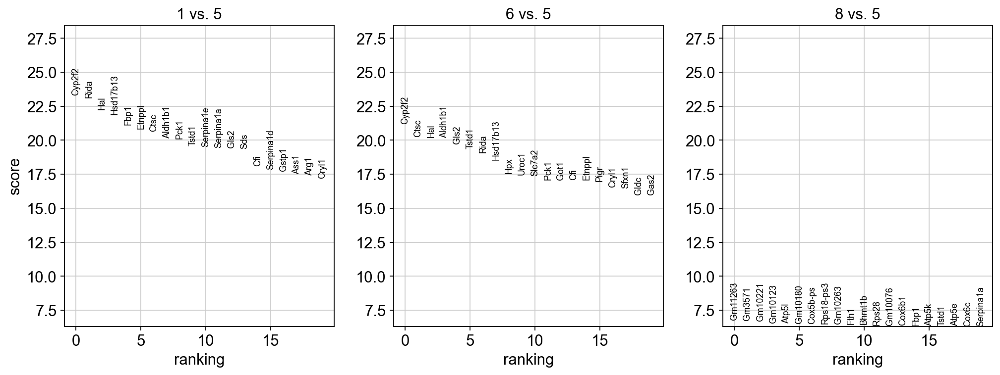

In [146]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['1', '6', '8'], reference='5', method='wilcoxon', use_raw=True)
sc.pl.rank_genes_groups(liver_ss3, groups=['1', '6', '8'], n_genes=20)

In [147]:
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})

In [148]:
mop_degs

,1_names,1_scores,1_pvals,1_pvals_adj,1_logfoldchanges,6_names,6_scores,6_pvals,6_pvals_adj,6_logfoldchanges,8_names,8_scores,8_pvals,8_pvals_adj,8_logfoldchanges
0,Cyp2f2,23.334808,1.966034e-120,6.071899e-117,5.183841,Cyp2f2,21.195894,1.042019e-99,4.022716e-96,5.205212,Gm11263,6.791348,1.110909e-11,3.480961e-08,2.955344
1,Rida,23.133976,2.107840e-118,4.649895e-115,1.519188,Ctsc,20.274174,2.174128e-91,4.796127e-88,5.677705,Gm3571,6.744527,1.535265e-11,3.480961e-08,2.873711
2,Hal,22.262022,8.626821e-110,1.332154e-106,3.452546,Hal,20.228168,5.531920e-91,1.067799e-87,3.284118,Gm10221,6.721117,1.803373e-11,3.480961e-08,2.538124
3,Hsd17b13,21.891850,3.106516e-106,4.360983e-103,2.634052,Aldh1b1,20.203741,9.075303e-91,1.557120e-87,6.837285,Gm10123,6.594700,4.261151e-11,5.981882e-08,1.387400
4,Fbp1,21.127293,4.464223e-99,4.595769e-96,1.284841,Gls2,19.767920,5.624781e-87,7.238156e-84,2.915950,Atp5l,6.540857,6.116743e-11,6.957647e-08,1.343400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15437,Slco1b2,-23.211813,3.459728e-119,8.904186e-116,-2.276751,Rnase4,-20.813200,3.286537e-96,8.458451e-93,-3.466479,Sord,-6.721117,1.803373e-11,3.480961e-08,-2.748478
15438,Rnase4,-23.355604,1.208814e-120,4.666625e-117,-3.350280,Cyp2c50,-20.821547,2.761280e-96,8.458451e-93,-3.850692,Slco1b2,-6.723457,1.774622e-11,3.480961e-08,-2.549111
15439,Cyp2c29,-23.665615,8.152102e-124,4.196158e-120,-4.844891,Rgn,-21.348156,4.056269e-101,2.087897e-97,-3.485231,Cyp2e1,-6.779643,1.204737e-11,3.480961e-08,-5.343698
15440,Rgn,-23.963448,6.691646e-127,5.166620e-123,-3.459778,Cyp2c29,-21.354670,3.528520e-101,2.087897e-97,-4.707760,Rnase4,-6.920105,4.513102e-12,3.480961e-08,-4.797603


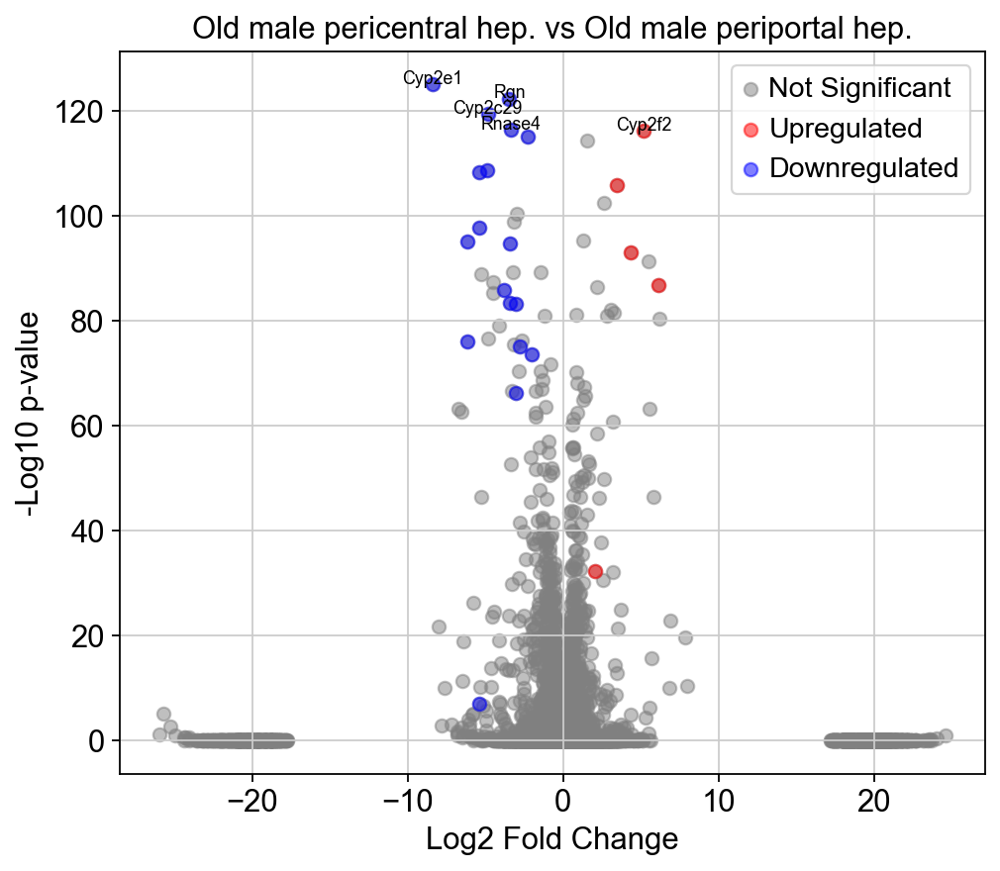

In [155]:


padj_columns = ['1_pvals_adj', '6_pvals_adj', '8_pvals_adj']
logfc_columns = ['1_logfoldchanges', '6_logfoldchanges', '8_logfoldchanges']
name_column =  '1_names'

for col in padj_columns + logfc_columns + [name_column]:
    if col not in mop_degs.columns:
        raise KeyError(f"Column '{col}' not found in DataFrame")

padj_threshold = 0.05
logfc_threshold = 2

mask_significant = (mop_degs[padj_columns] < padj_threshold).all(axis=1)
mask_logfc = (mop_degs[logfc_columns].abs() > logfc_threshold).all(axis=1)

significant_genes = mop_degs[mask_significant & mask_logfc]

upregulated_mask = (significant_genes[logfc_columns] > logfc_threshold).all(axis=1)
downregulated_mask = (significant_genes[logfc_columns] < -logfc_threshold).all(axis=1)

upregulated_genes = significant_genes[upregulated_mask]
downregulated_genes = significant_genes[downregulated_mask]

top_genes = significant_genes.sort_values(by=padj_columns).head(5)

plt.figure(figsize=(7, 6))
plt.scatter(mop_degs[logfc_columns[0]], -np.log10(mop_degs[padj_columns[0]]), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes[logfc_columns[0]], -np.log10(upregulated_genes[padj_columns[0]]), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes[logfc_columns[0]], -np.log10(downregulated_genes[padj_columns[0]]), c='blue', alpha=0.5, label='Downregulated')

for i, row in top_genes.iterrows():
    plt.text(row[logfc_columns[0]], -np.log10(row[padj_columns[0]]) + 0.1, row[name_column], fontsize=8, ha='center')

plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male pericentral hep. vs Old male periportal hep.')
plt.legend()
plt.show()

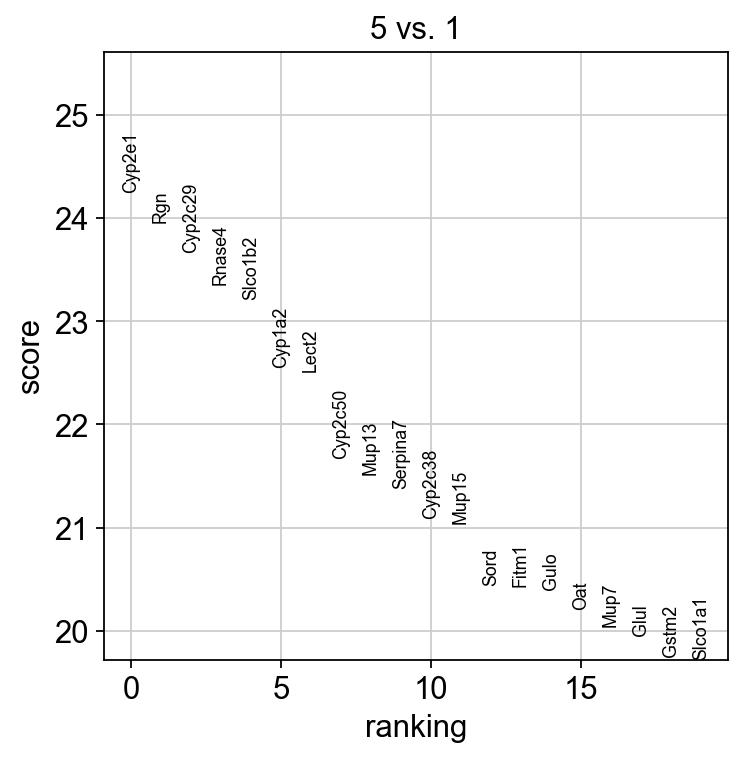

In [88]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='1', method='wilcoxon', use_raw=True)
sc.pl.rank_genes_groups(liver_ss3, groups=['5'], n_genes=20)

In [89]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='1', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs


,5_names,5_scores,5_pvals,5_pvals_adj,5_logfoldchanges
0,Cyp2e1,24.253107,6.131313e-130,9.467974e-126,8.416945
1,Rgn,23.963448,6.691646e-127,5.166620e-123,3.459778
2,Cyp2c29,23.665615,8.152102e-124,4.196158e-120,4.844891
3,Rnase4,23.355604,1.208814e-120,4.666625e-117,3.350280
4,Slco1b2,23.211813,3.459728e-119,8.904186e-116,2.276751
...,...,...,...,...,...
15437,Fbp1,-21.127293,4.464223e-99,4.595769e-96,-1.284841
15438,Hsd17b13,-21.891850,3.106516e-106,4.360983e-103,-2.634052
15439,Hal,-22.262022,8.626821e-110,1.332154e-106,-3.452546
15440,Rida,-23.133976,2.107840e-118,4.649895e-115,-1.519188


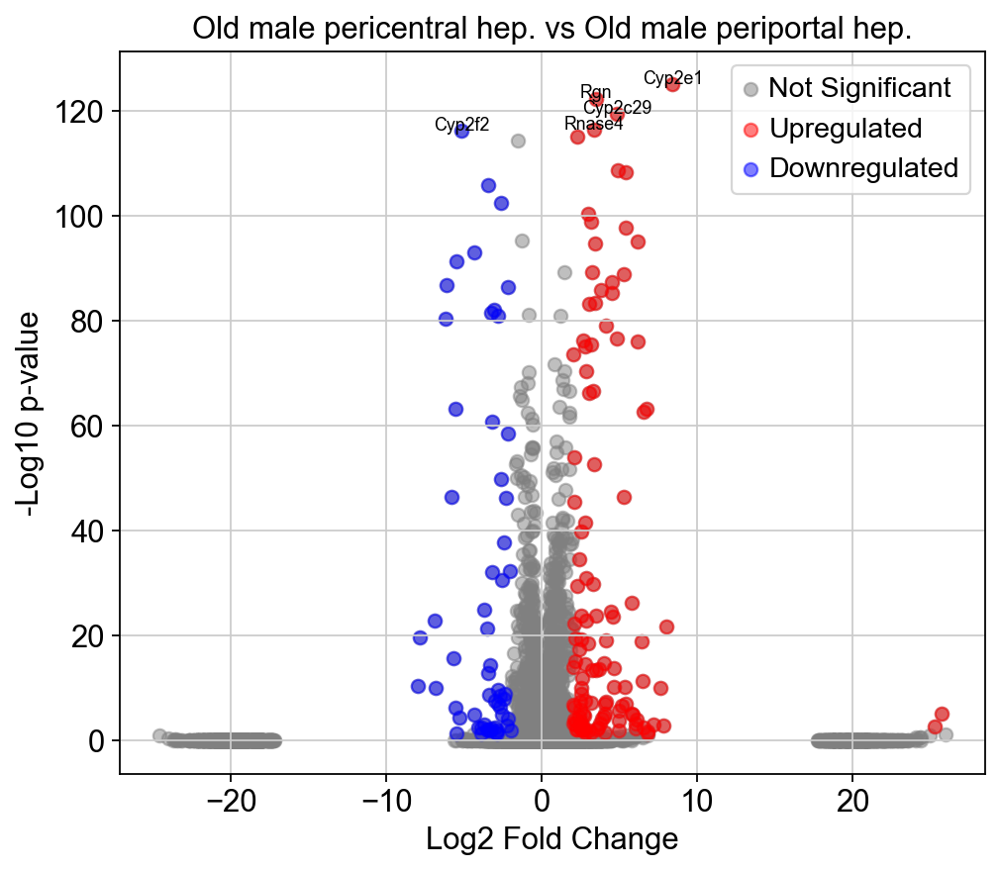

In [92]:
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['5_pvals_adj'] < padj_threshold) & (mop_degs['5_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='5_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['5_logfoldchanges'], -np.log10(mop_degs['5_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['5_logfoldchanges'], -np.log10(upregulated_genes['5_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['5_logfoldchanges'], -np.log10(downregulated_genes['5_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i, row in top_genes.iterrows():
    plt.text(row['5_logfoldchanges'], -np.log10(row['5_pvals_adj']) + 0.1, row['5_names'],
             fontsize=8, ha='center')
plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male pericentral hep. vs Old male periportal hep.')
plt.legend()
plt.show()

In [94]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [95]:
names = results['names']['5']
logfoldchanges = results['logfoldchanges']['5']
pvals = pvals_adj['5']
mean_expression = liver_ss3.raw[:, results['names']['5']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]


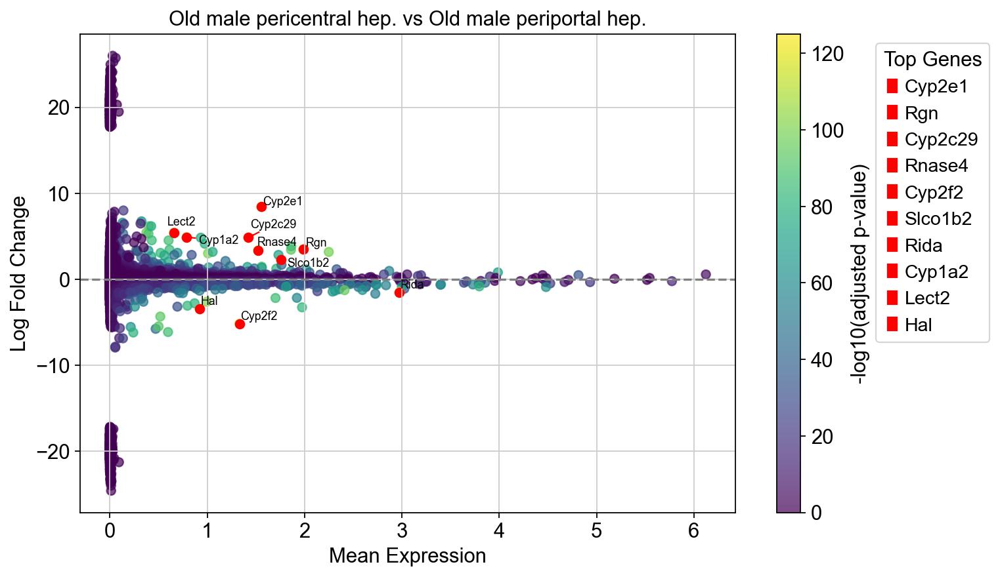

In [96]:
import matplotlib.patches as mpatches
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male pericentral hep. vs Old male periportal hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['5'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['5'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

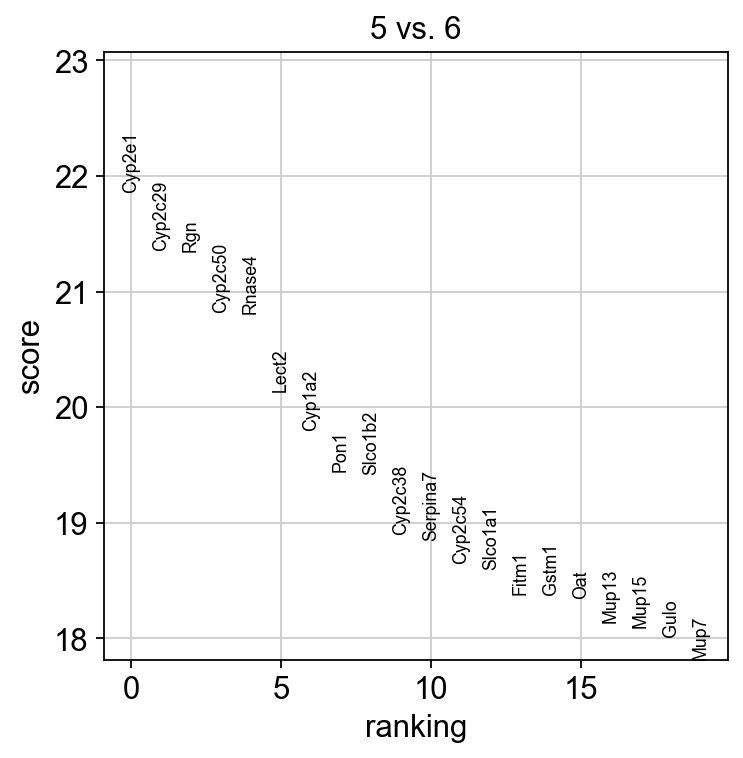

In [97]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='6', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['5'], n_genes=20)

In [98]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='6', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs

,5_names,5_scores,5_pvals,5_pvals_adj,5_logfoldchanges
0,Cyp2e1,21.862146,5.957710e-106,9.199895e-102,7.243488
1,Cyp2c29,21.354670,3.528520e-101,2.087897e-97,4.707760
2,Rgn,21.348156,4.056269e-101,2.087897e-97,3.485231
3,Cyp2c50,20.821547,2.761280e-96,8.458451e-93,3.850692
4,Rnase4,20.813200,3.286537e-96,8.458451e-93,3.466479
...,...,...,...,...,...
15437,Gls2,-19.767920,5.624781e-87,7.238156e-84,-2.915950
15438,Aldh1b1,-20.203741,9.075303e-91,1.557120e-87,-6.837285
15439,Hal,-20.228168,5.531920e-91,1.067799e-87,-3.284118
15440,Ctsc,-20.274174,2.174128e-91,4.796127e-88,-5.677705


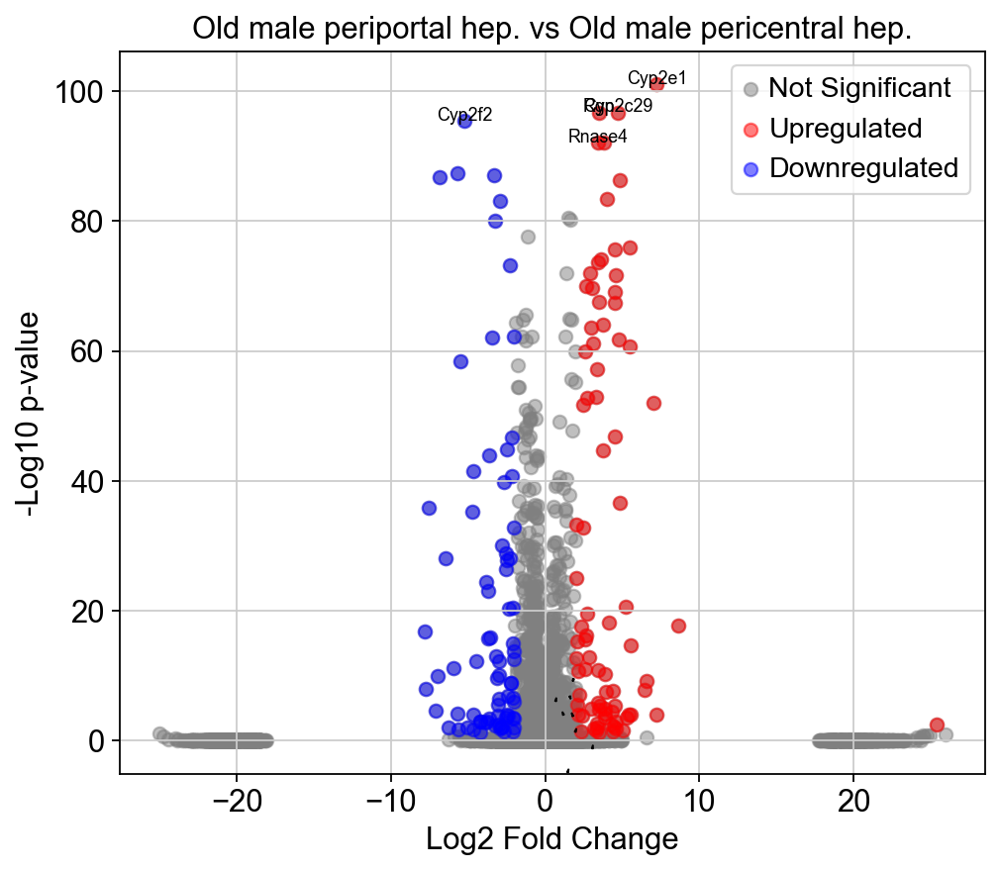

In [99]:

padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['5_pvals_adj'] < padj_threshold) & (mop_degs['5_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='5_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['5_logfoldchanges'], -np.log10(mop_degs['5_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['5_logfoldchanges'], -np.log10(upregulated_genes['5_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['5_logfoldchanges'], -np.log10(downregulated_genes['5_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i, row in top_genes.iterrows():
    plt.text(row['5_logfoldchanges'], -np.log10(row['5_pvals_adj']) + 0.1, row['5_names'],
             fontsize=8, ha='center')
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black'))

plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep. vs Old male pericentral hep.')
plt.legend()
plt.show()

In [100]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [101]:
names = results['names']['5']
logfoldchanges = results['logfoldchanges']['5']
pvals = pvals_adj['5']
mean_expression = liver_ss3.raw[:, results['names']['5']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]


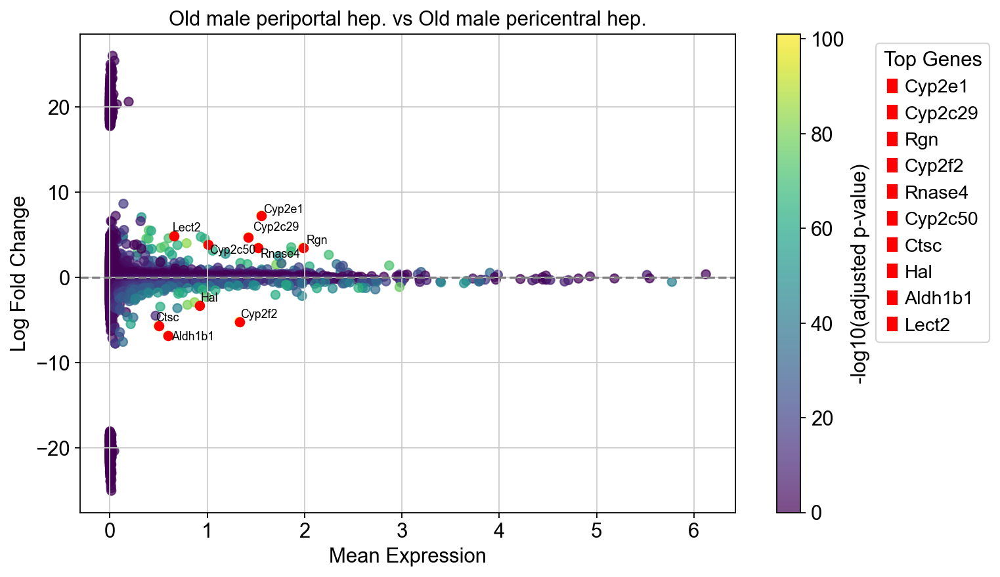

In [102]:
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male periportal hep. vs Old male pericentral hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['5'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['5'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

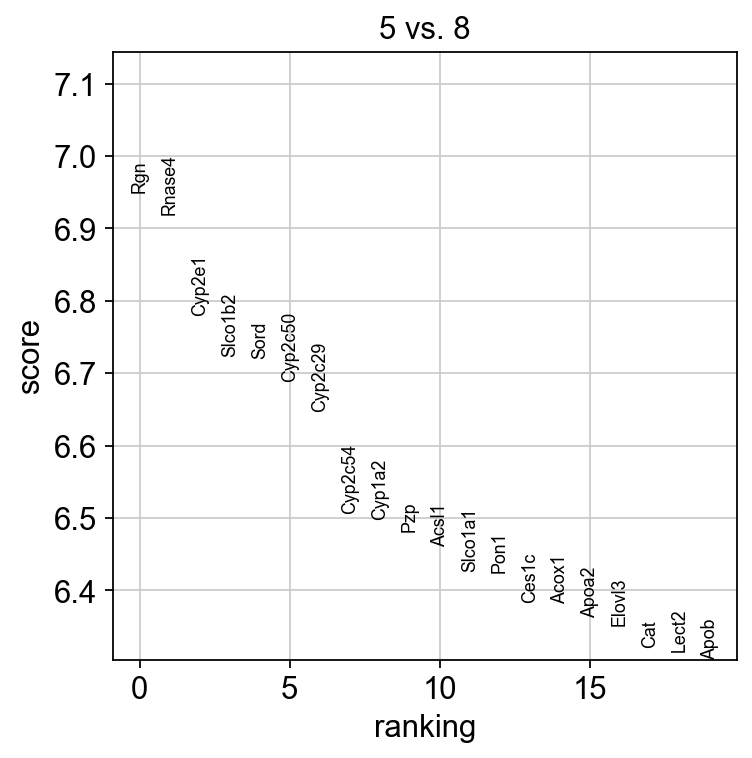

In [103]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='8', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['5'], n_genes=20)

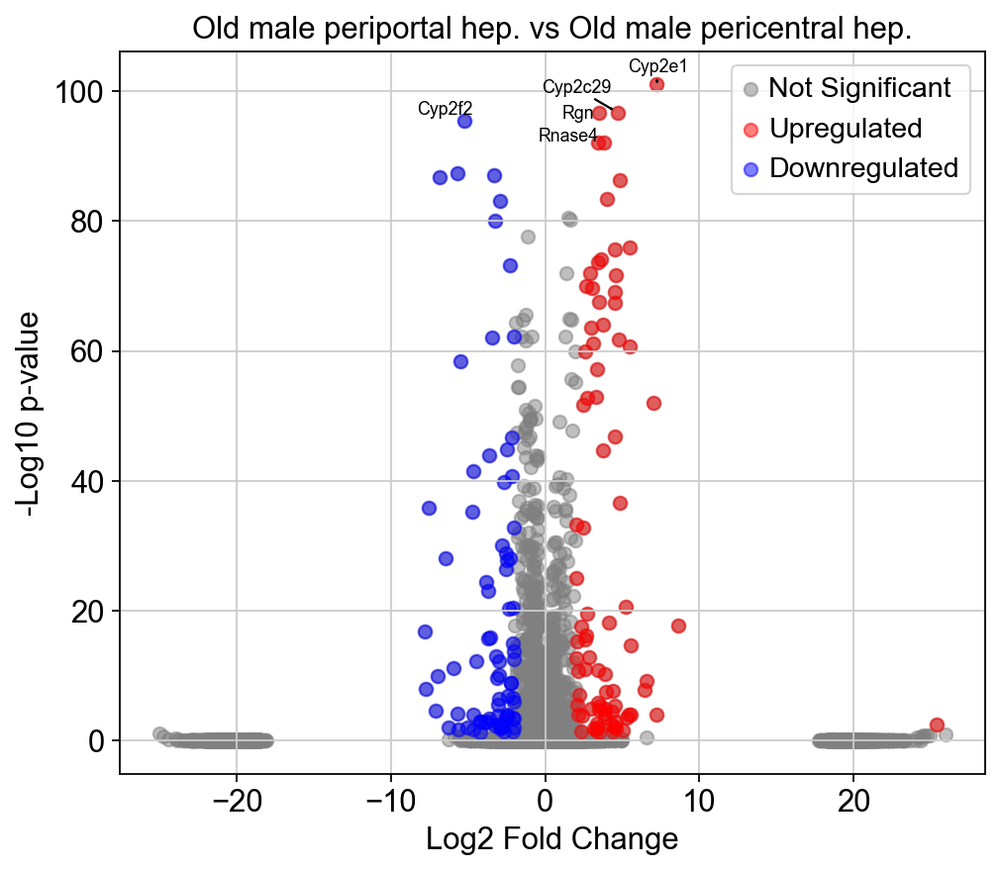

In [104]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='6', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['5_pvals_adj'] < padj_threshold) & (mop_degs['5_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='5_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['5_logfoldchanges'], -np.log10(mop_degs['5_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['5_logfoldchanges'], -np.log10(upregulated_genes['5_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['5_logfoldchanges'], -np.log10(downregulated_genes['5_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
texts = []
for i in top_genes.index:
    texts.append(
        plt.text(top_genes.at[i, '5_logfoldchanges'], -np.log10(top_genes.at[i, '5_pvals_adj']),
                 top_genes.at[i, '5_names'], fontsize=8, ha='right')
    )

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='black'))

plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep. vs Old male pericentral hep.')
plt.legend()
plt.show()

In [105]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [106]:
names = results['names']['5']
logfoldchanges = results['logfoldchanges']['5']
pvals = pvals_adj['5']
mean_expression = liver_ss3.raw[:, results['names']['5']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]

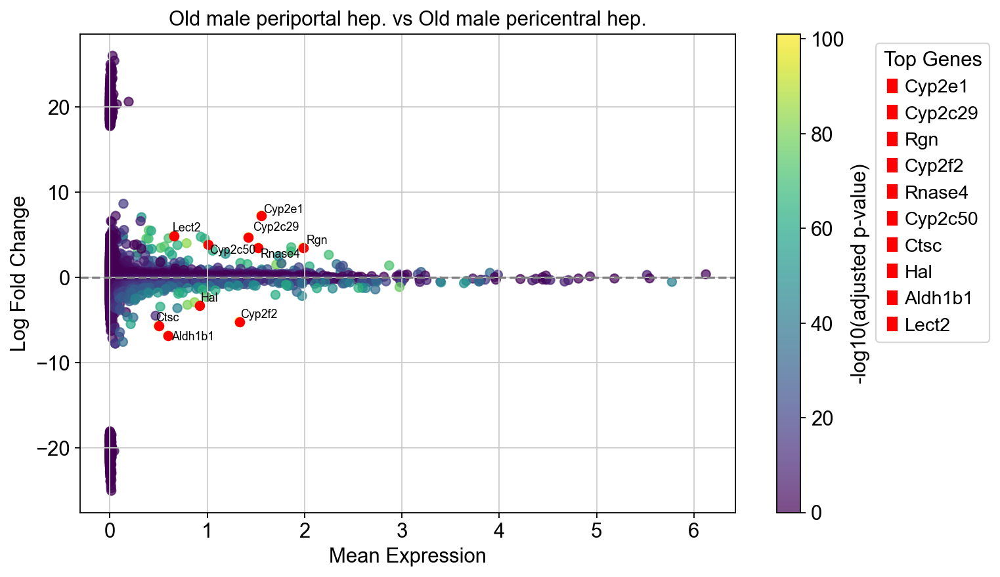

In [107]:
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male periportal hep. vs Old male pericentral hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['5'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['5'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

# Comparing the gene expression of old female pericentral hepatocytes(cluster 3) against old female periportal hepatocytes (cluster 4)
The questions I am trying to answer are:

- How does old age affect female periportal and pericentral hepatocytes?
- What functions are affected?

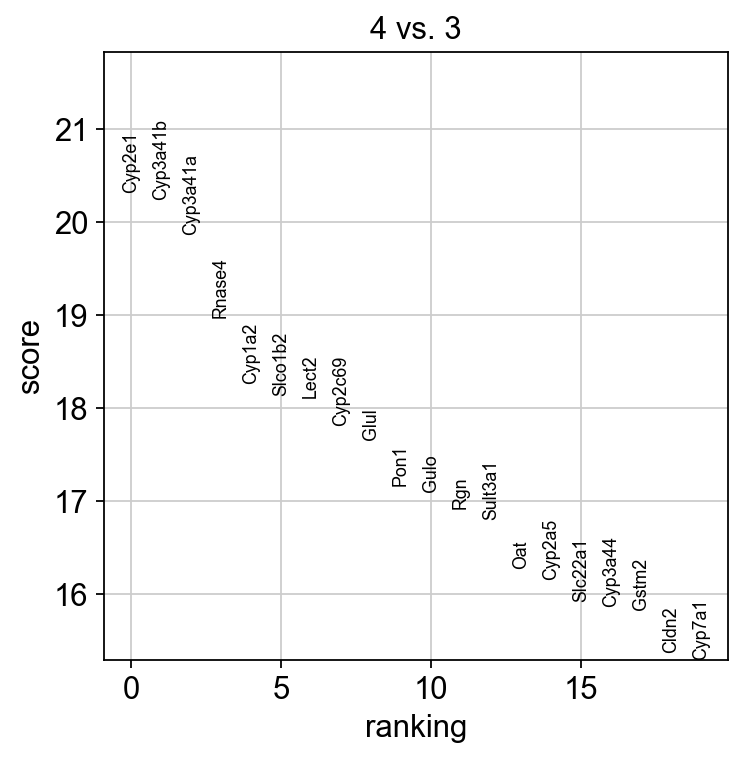

In [108]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['4'], reference='3', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['4'], n_genes=20)

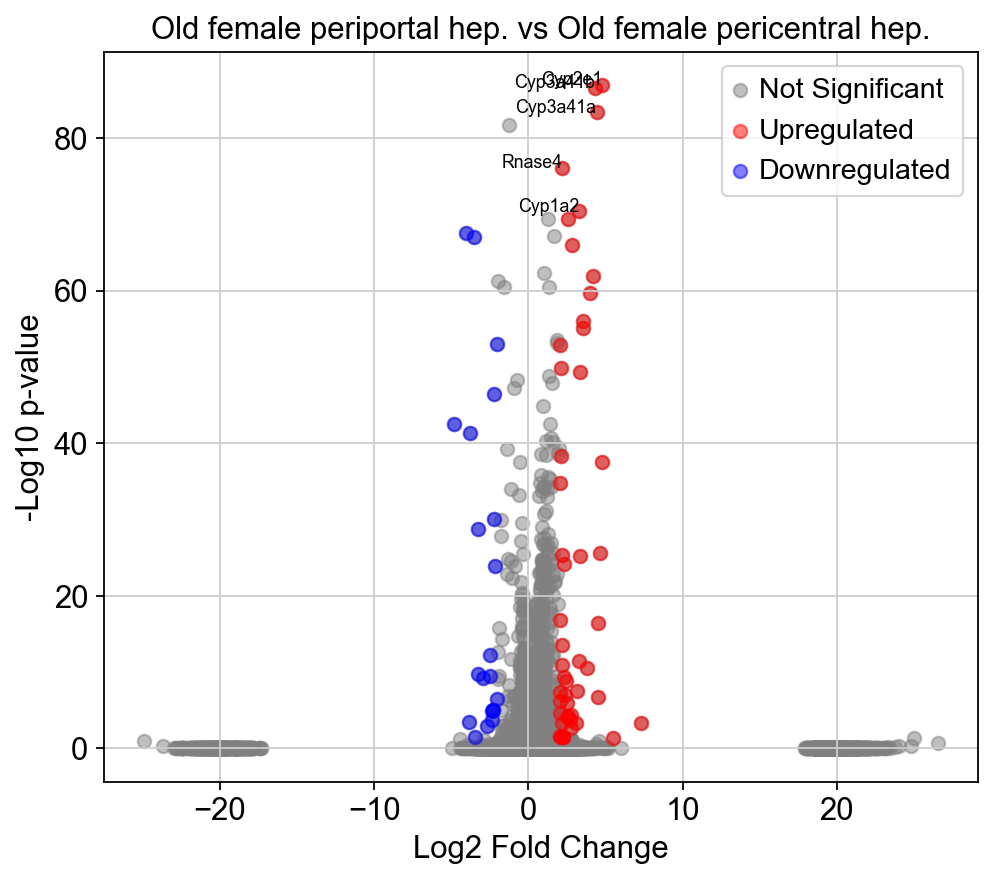

In [139]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['4'], reference='3', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['4_pvals_adj'] < padj_threshold) & (mop_degs['4_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['4_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['4_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='4_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['4_logfoldchanges'], -np.log10(mop_degs['4_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['4_logfoldchanges'], -np.log10(upregulated_genes['4_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['4_logfoldchanges'], -np.log10(downregulated_genes['4_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i in top_genes.index:
    texts.append(
        plt.text(top_genes.at[i, '4_logfoldchanges'], -np.log10(top_genes.at[i, '4_pvals_adj']),
                 top_genes.at[i, '4_names'], fontsize=8, ha='right')
    )


plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old female periportal hep. vs Old female pericentral hep.')
plt.legend()
plt.show()

In [110]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [111]:
names = results['names']['4']
logfoldchanges = results['logfoldchanges']['4']
pvals = pvals_adj['4']
mean_expression = liver_ss3.raw[:, results['names']['4']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]

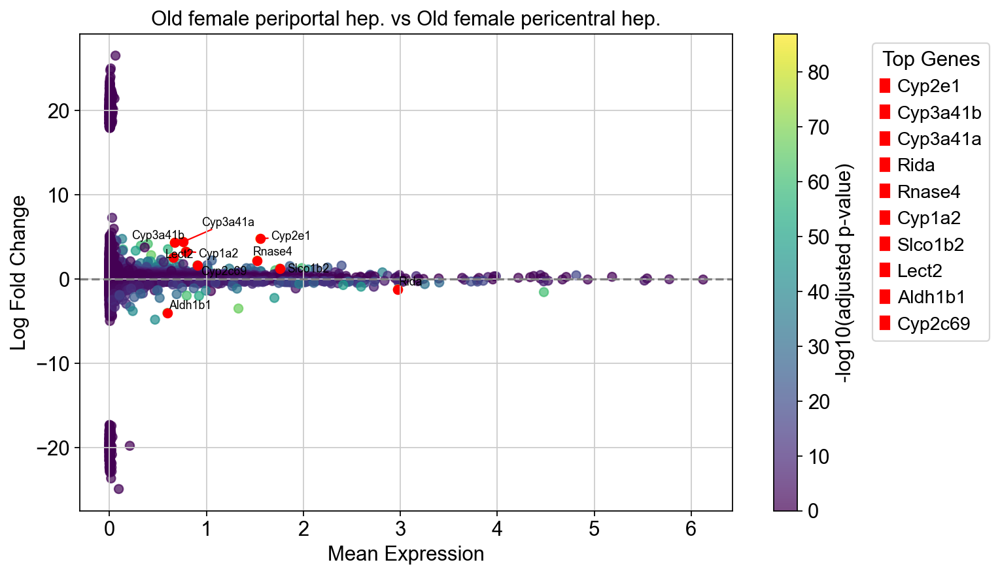

In [112]:
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old female periportal hep. vs Old female pericentral hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['4'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['4'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

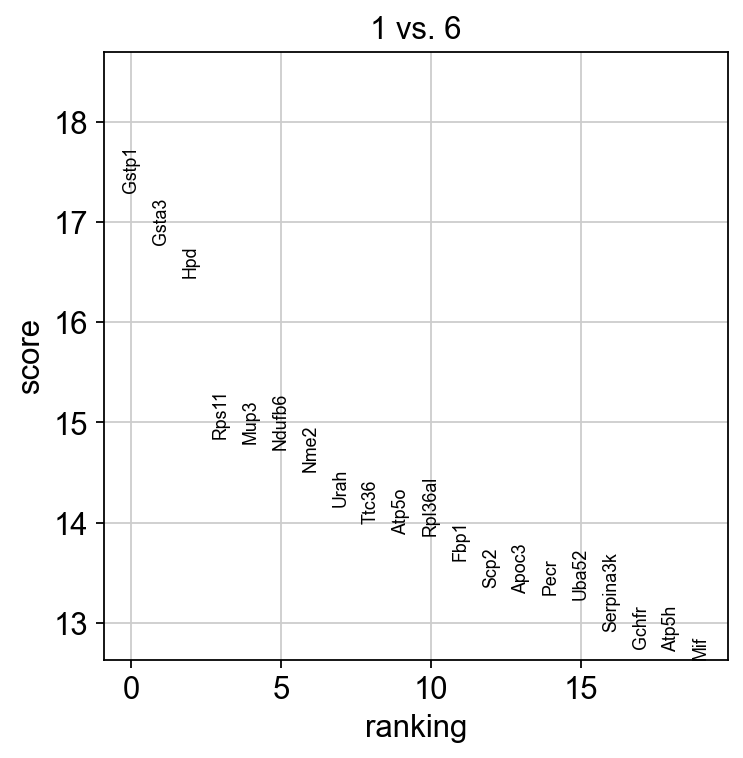

In [113]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['1'], reference='6', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['1'], n_genes=20)

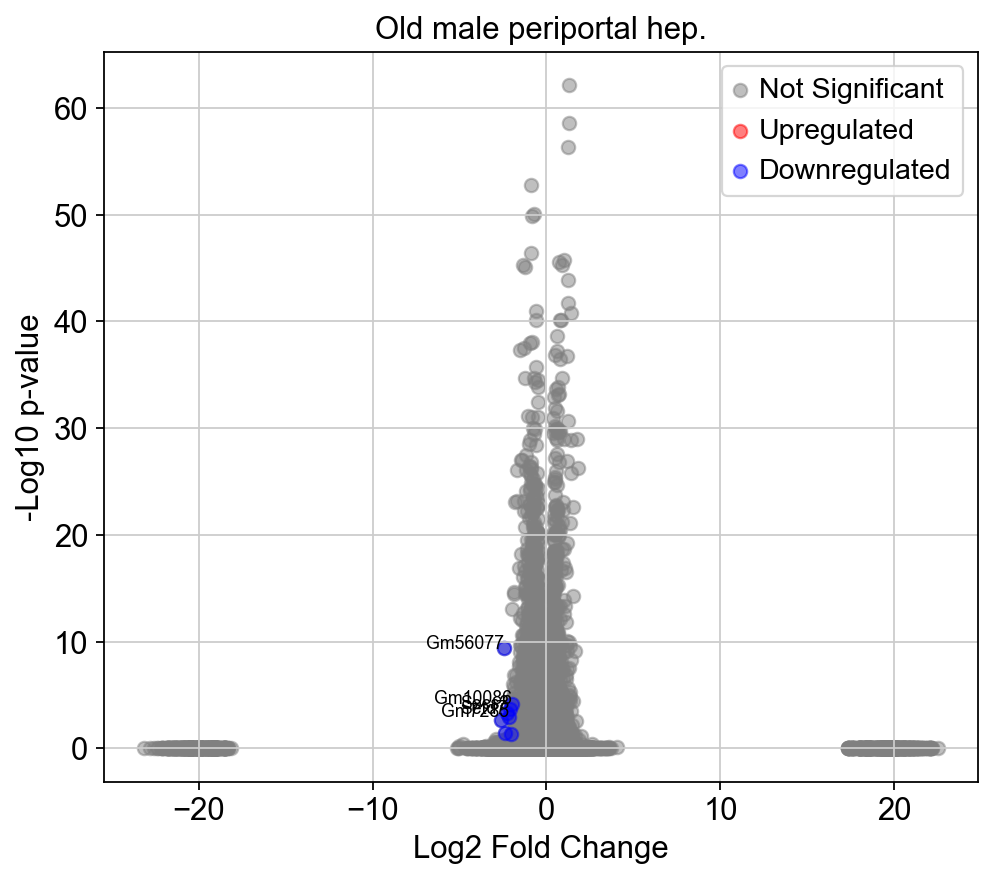

In [138]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['1'], reference='6', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['1_pvals_adj'] < padj_threshold) & (mop_degs['1_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['1_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['1_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='1_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['1_logfoldchanges'], -np.log10(mop_degs['1_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['1_logfoldchanges'], -np.log10(upregulated_genes['1_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['1_logfoldchanges'], -np.log10(downregulated_genes['1_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i in top_genes.index:
    texts.append(
        plt.text(top_genes.at[i, '1_logfoldchanges'], -np.log10(top_genes.at[i, '1_pvals_adj']),
                 top_genes.at[i, '1_names'], fontsize=8, ha='right')
    )


plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep.')
plt.legend()
plt.show()

In [115]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [116]:
names = results['names']['1']
logfoldchanges = results['logfoldchanges']['1']
pvals = pvals_adj['1']
mean_expression = liver_ss3.raw[:, results['names']['1']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 5
top_genes = np.argsort(pvals)[:top_n]

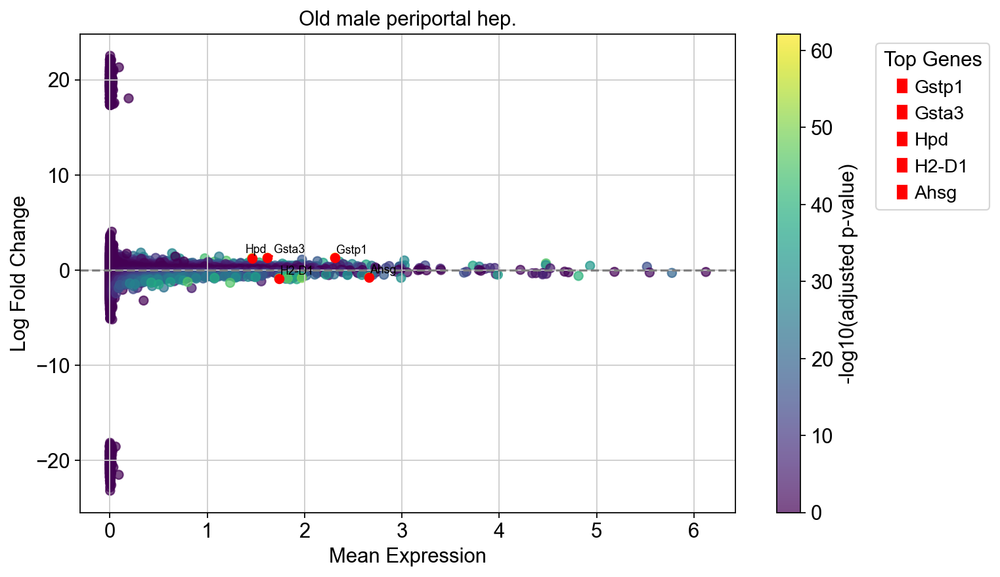

In [117]:
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male periportal hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['1'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['1'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

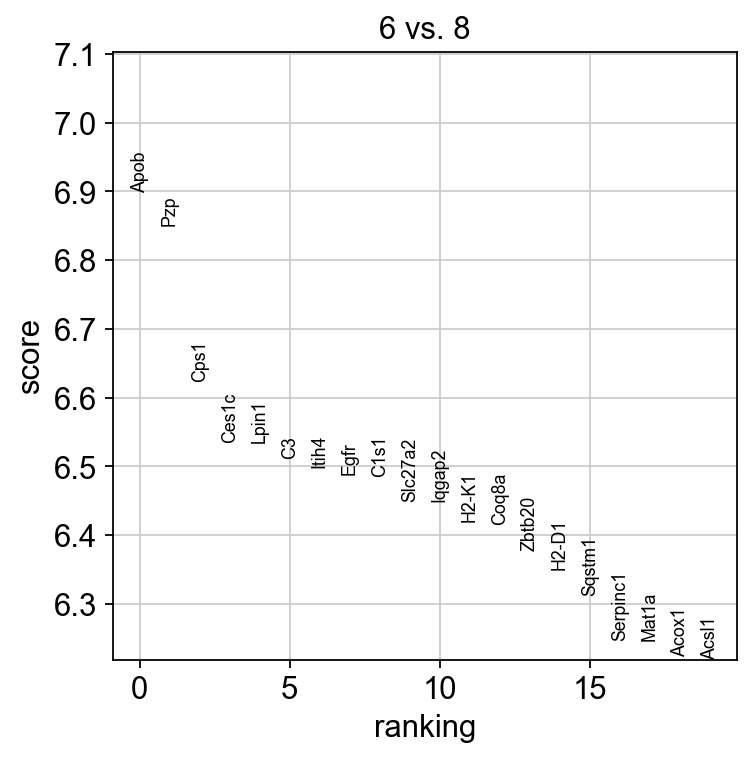

In [118]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['6'], reference='8', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['6'], n_genes=20)

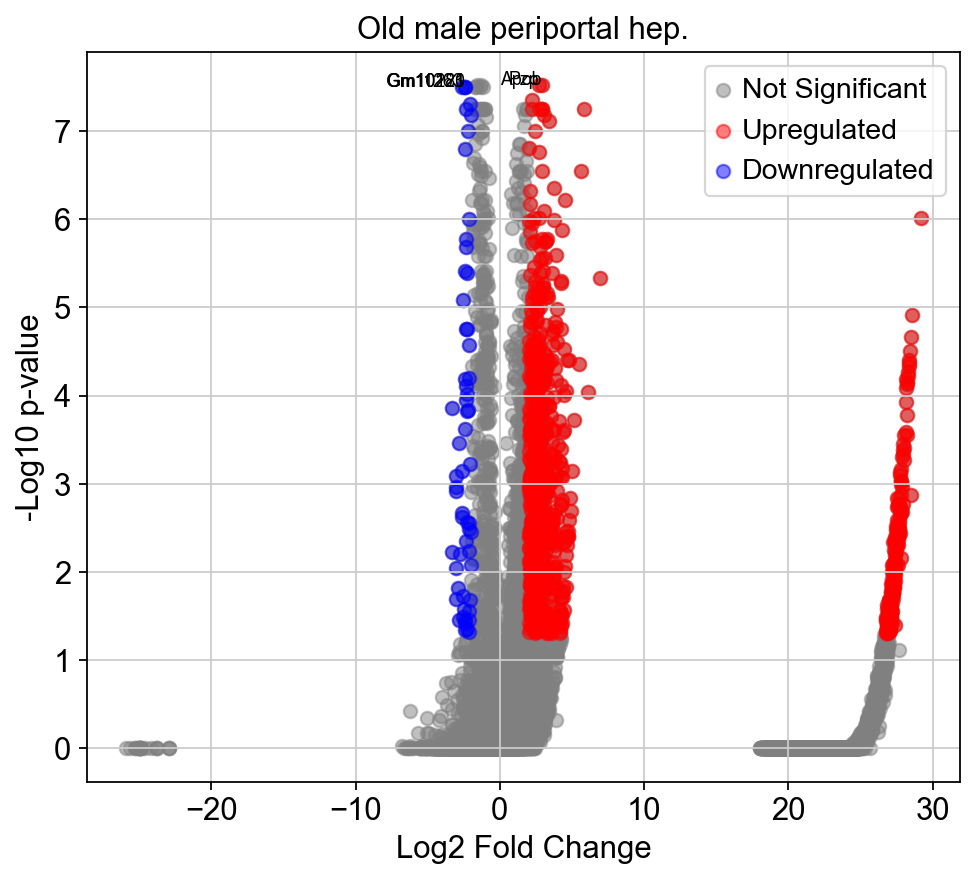

In [137]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['6'], reference='8', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['6_pvals_adj'] < padj_threshold) & (mop_degs['6_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['6_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['6_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='6_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['6_logfoldchanges'], -np.log10(mop_degs['6_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['6_logfoldchanges'], -np.log10(upregulated_genes['6_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['6_logfoldchanges'], -np.log10(downregulated_genes['6_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i in top_genes.index:
    texts.append(
        plt.text(top_genes.at[i, '6_logfoldchanges'], -np.log10(top_genes.at[i, '6_pvals_adj']),
                 top_genes.at[i, '6_names'], fontsize=8, ha='right')
    )

plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep.')
plt.legend()
plt.show()

In [120]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [121]:
names = results['names']['6']
logfoldchanges = results['logfoldchanges']['6']
pvals = pvals_adj['6']
mean_expression = liver_ss3.raw[:, results['names']['6']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]

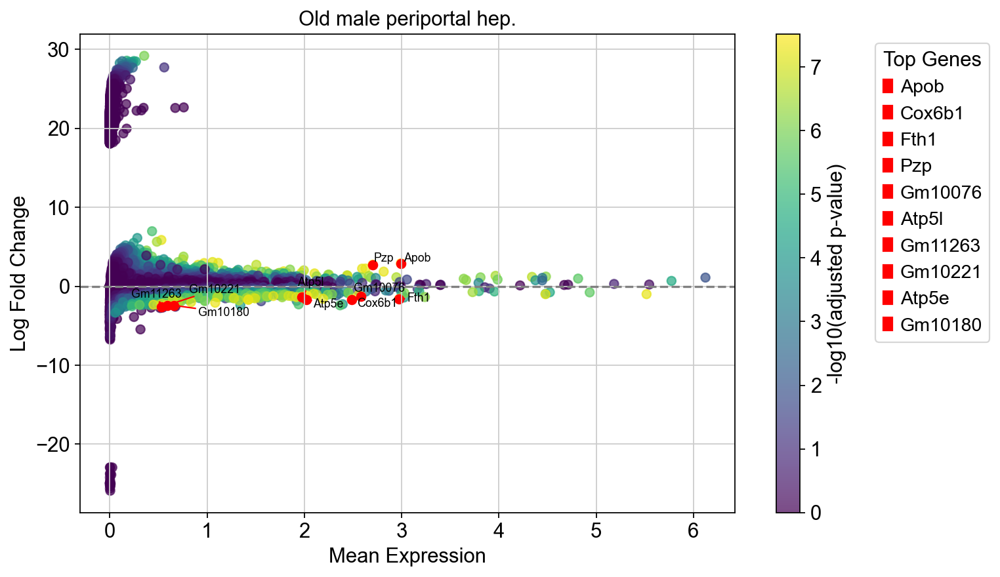

In [122]:
plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male periportal hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['6'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['6'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

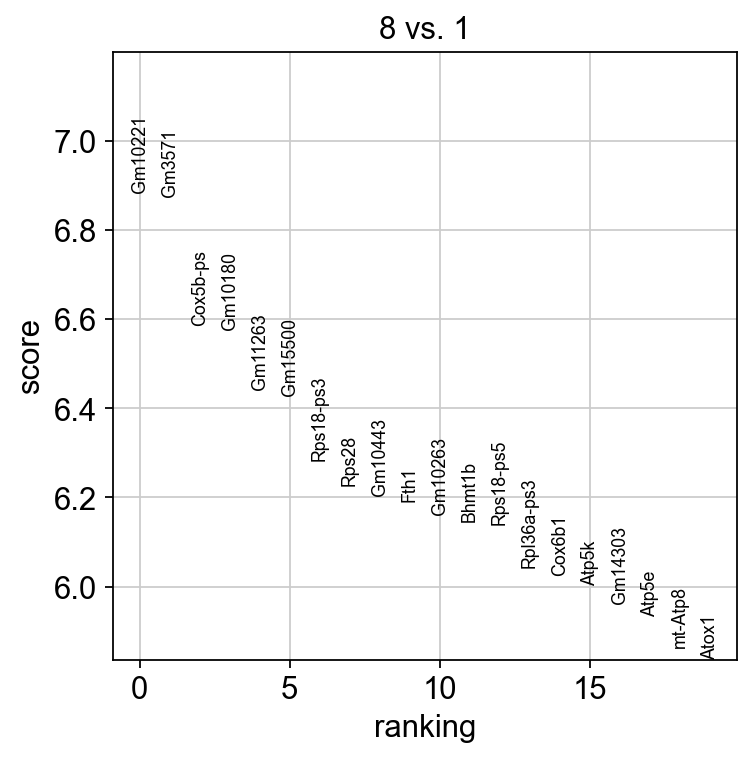

In [123]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['8'], reference='1', method='wilcoxon')
sc.pl.rank_genes_groups(liver_ss3, groups=['8'], n_genes=20)

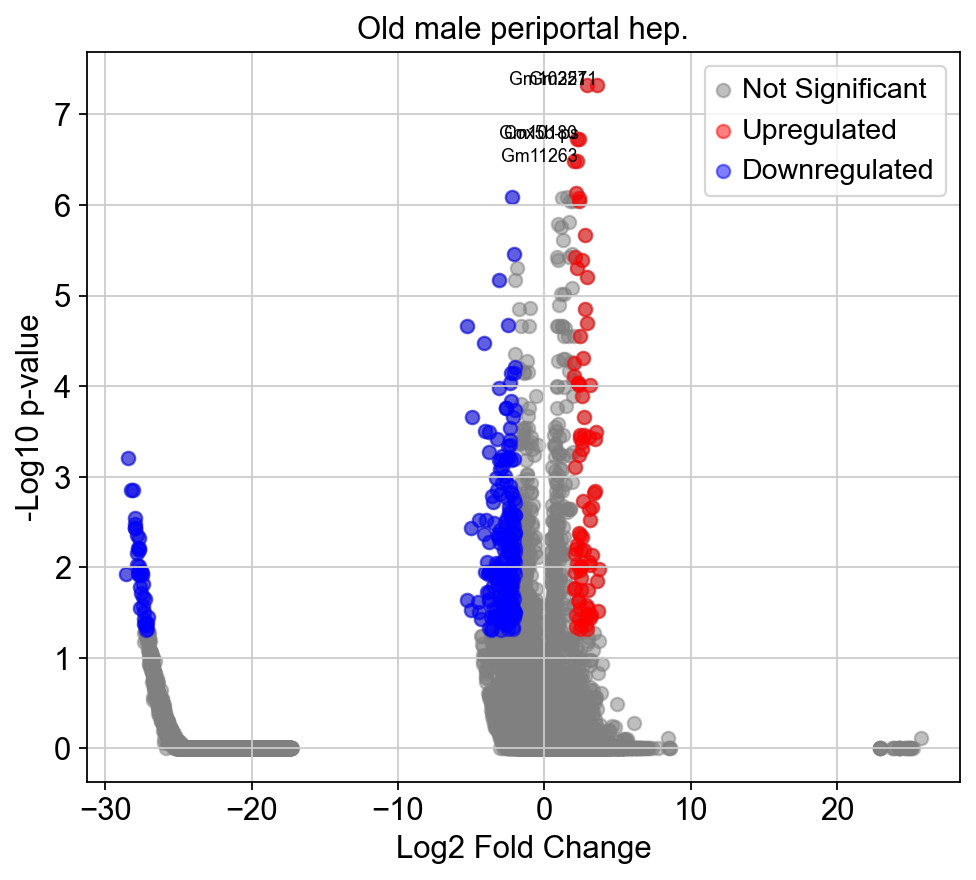

In [136]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['8'], reference='1', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['8_pvals_adj'] < padj_threshold) & (mop_degs['8_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['8_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['8_logfoldchanges'] < -logfc_threshold]
top_genes = significant_genes.sort_values(by='8_pvals_adj').head(5)
plt.figure(figsize=(7, 6))
plt.scatter(mop_degs['8_logfoldchanges'], -np.log10(mop_degs['8_pvals_adj']), c='grey', alpha=0.5, label='Not Significant')
plt.scatter(upregulated_genes['8_logfoldchanges'], -np.log10(upregulated_genes['8_pvals_adj']), c='red', alpha=0.5, label='Upregulated')
plt.scatter(downregulated_genes['8_logfoldchanges'], -np.log10(downregulated_genes['8_pvals_adj']), c='blue', alpha=0.5, label='Downregulated')
for i in top_genes.index:
    texts.append(
        plt.text(top_genes.at[i, '8_logfoldchanges'], -np.log10(top_genes.at[i, '8_pvals_adj']),
                 top_genes.at[i, '8_names'], fontsize=8, ha='right')
    )
plt.xlabel('Log2 Fold Change')
plt.ylabel('-Log10 p-value')
plt.title('Old male periportal hep.')
plt.legend()
plt.show()

In [125]:
results = liver_ss3.uns['rank_genes_groups']
groups = results['names'].dtype.names
pvals_adj = results['pvals_adj']

In [126]:
names = results['names']['8']
logfoldchanges = results['logfoldchanges']['8']
pvals = pvals_adj['8']
mean_expression = liver_ss3.raw[:, results['names']['8']].X.mean(axis=0)
mean_expression = np.array(mean_expression).flatten()
top_n = 10
top_genes = np.argsort(pvals)[:top_n]

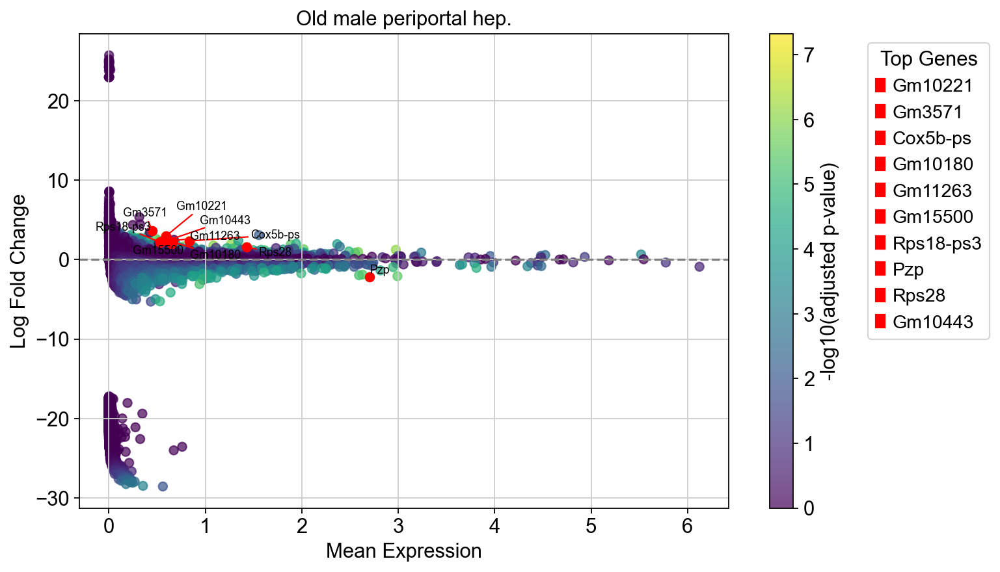

In [127]:
import matplotlib.patches as mpatches

plt.figure(figsize=(10, 6))
plt.scatter(mean_expression, logfoldchanges, c=-np.log10(pvals), cmap='viridis', alpha=0.7)
plt.colorbar(label='-log10(adjusted p-value)')
plt.axhline(0, color='grey', linestyle='--')
plt.xlabel('Mean Expression')
plt.ylabel('Log Fold Change')
plt.title('Old male periportal hep.')
texts = []
for i in top_genes:
    gene_name = liver_ss3.uns['rank_genes_groups']['names']['8'][i]
    plt.scatter(mean_expression[i], logfoldchanges[i], color='red')
    texts.append(plt.text(mean_expression[i], logfoldchanges[i], gene_name, fontsize=8))

adjust_text(texts, arrowprops=dict(arrowstyle='->', color='red'))

handles = [mpatches.Patch(color='red', label=liver_ss3.uns['rank_genes_groups']['names']['8'][i]) for i in top_genes]
plt.legend(handles=handles, title='Top Genes', bbox_to_anchor=(1.2, 1), loc='upper left')

plt.show()

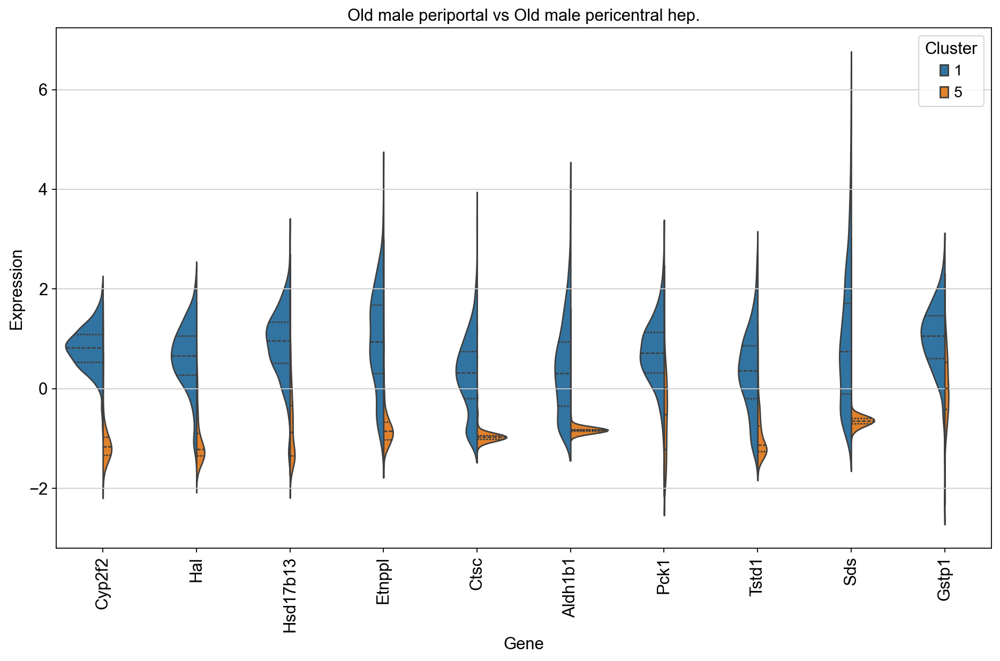

In [128]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

sc.tl.rank_genes_groups(liver_ss3, groupby='leiden', method='wilcoxon')

def create_violin_plot(ad, clusters_1, clusters_2, title, top_n=10):
    group_key = 'leiden'
    ad_sub = ad[ad.obs[group_key].isin(clusters_1 + clusters_2)]

    sc.tl.rank_genes_groups(ad_sub, groupby=group_key, method='wilcoxon')

    all_genes = []
    for cluster in clusters_1:
        all_genes.extend(ad_sub.uns['rank_genes_groups']['names'][cluster])
    valid_genes = [gene for gene in all_genes if gene in ad_sub.var_names][:top_n]

    top_gene_expression = ad_sub[:, valid_genes].to_df()
    top_gene_expression['Cluster'] = ad_sub.obs['leiden']

    melted_df = top_gene_expression.melt(id_vars='Cluster', var_name='Gene', value_name='Expression')

    plt.figure(figsize=(14, 8))
    sns.violinplot(x='Gene', y='Expression', hue='Cluster', data=melted_df, split=True, inner='quartile')
    plt.title(title)
    plt.xticks(rotation=90)
    plt.legend(title='Cluster')
    plt.show()

create_violin_plot(liver_ss3, ['1'], ['5'], "Old male periportal vs Old male pericentral hep.")


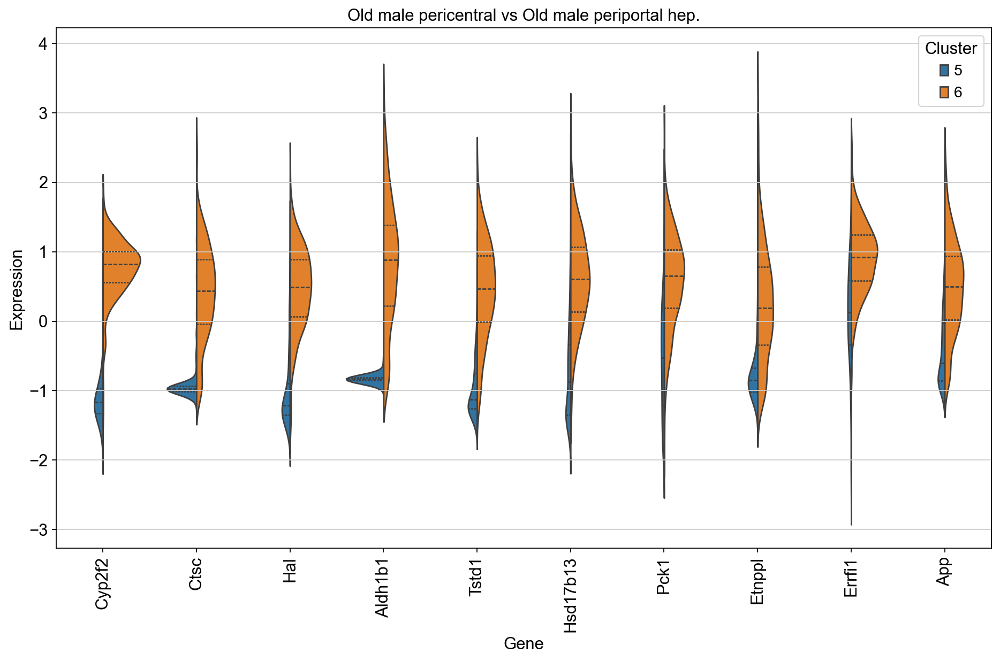

In [129]:
create_violin_plot(liver_ss3, ['6'], ['5'], "Old male pericentral vs Old male periportal hep.")

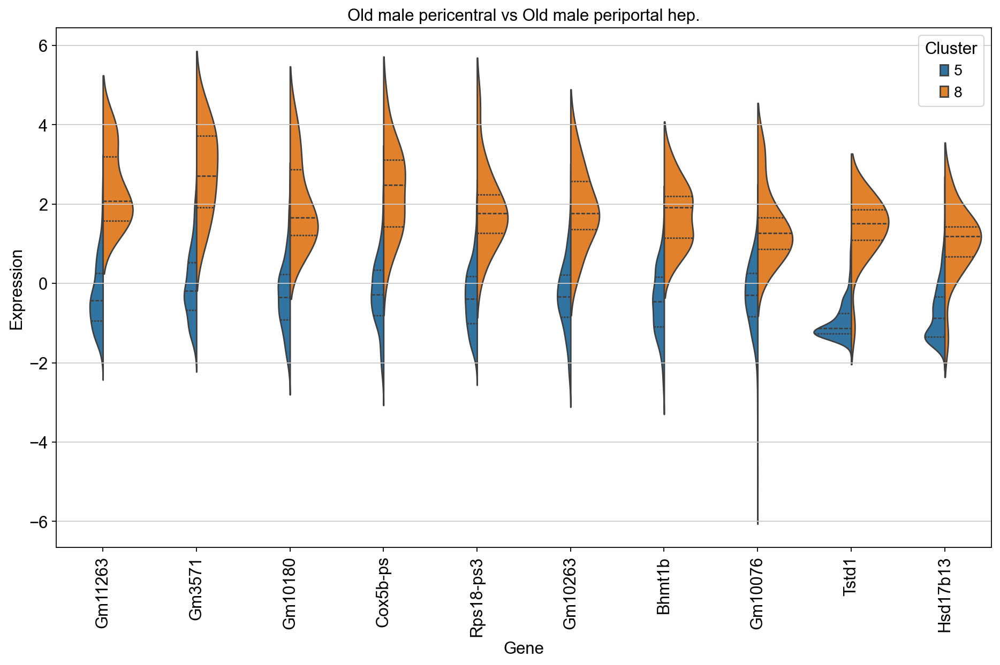

In [130]:
create_violin_plot(liver_ss3, ['8'], ['5'], "Old male pericentral vs Old male periportal hep.")

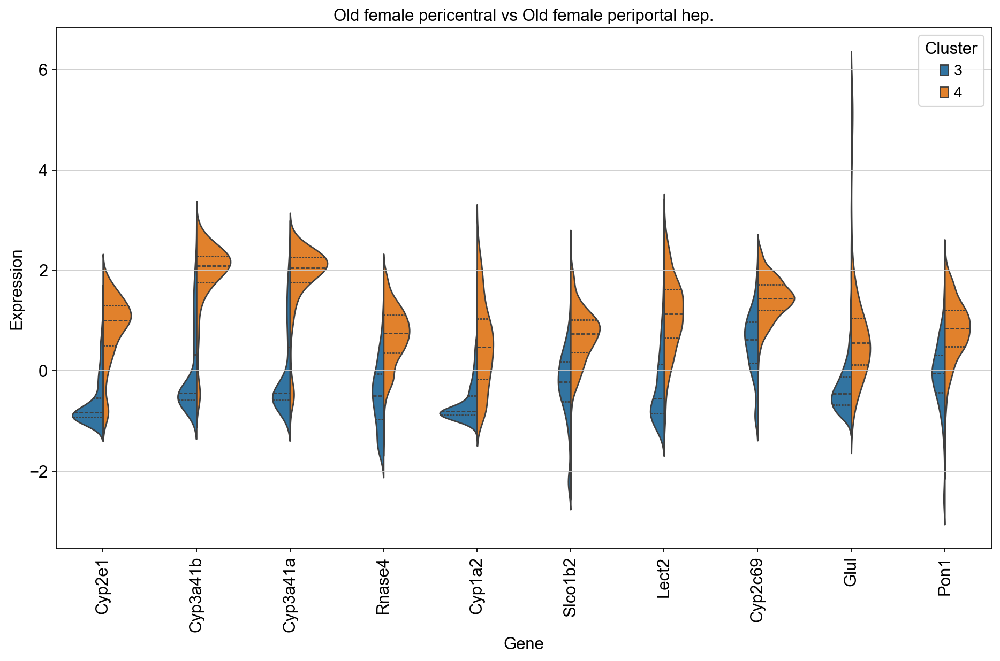

In [131]:
create_violin_plot(liver_ss3, ['4'], ['3'], "Old female pericentral vs Old female periportal hep.")

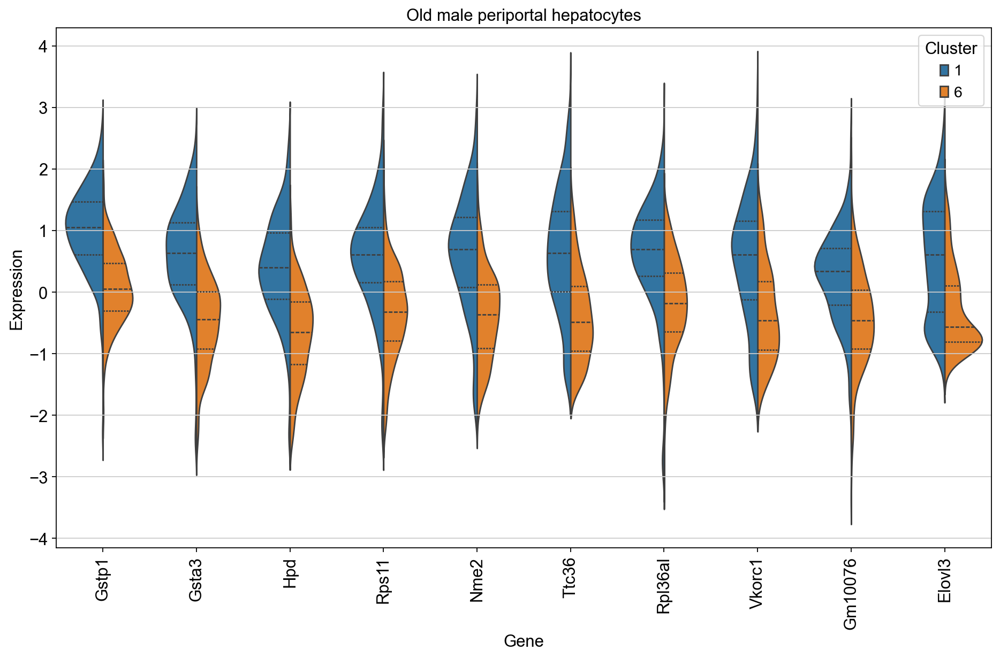

In [132]:
create_violin_plot(liver_ss3, ['1'], ['6'], "Old male periportal hepatocytes")

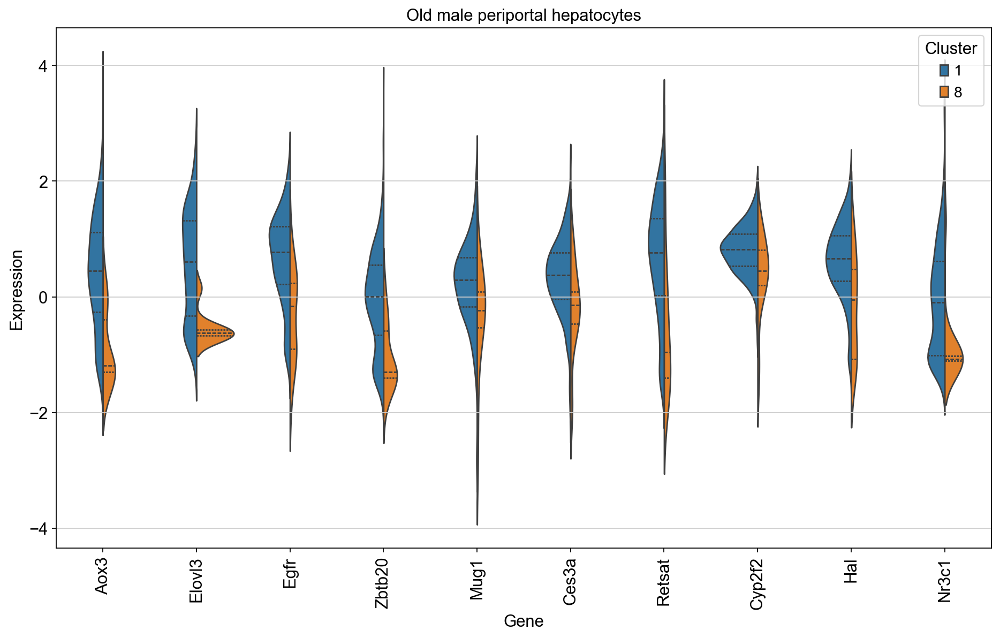

In [133]:
create_violin_plot(liver_ss3, ['1'], ['8'], "Old male periportal hepatocytes")

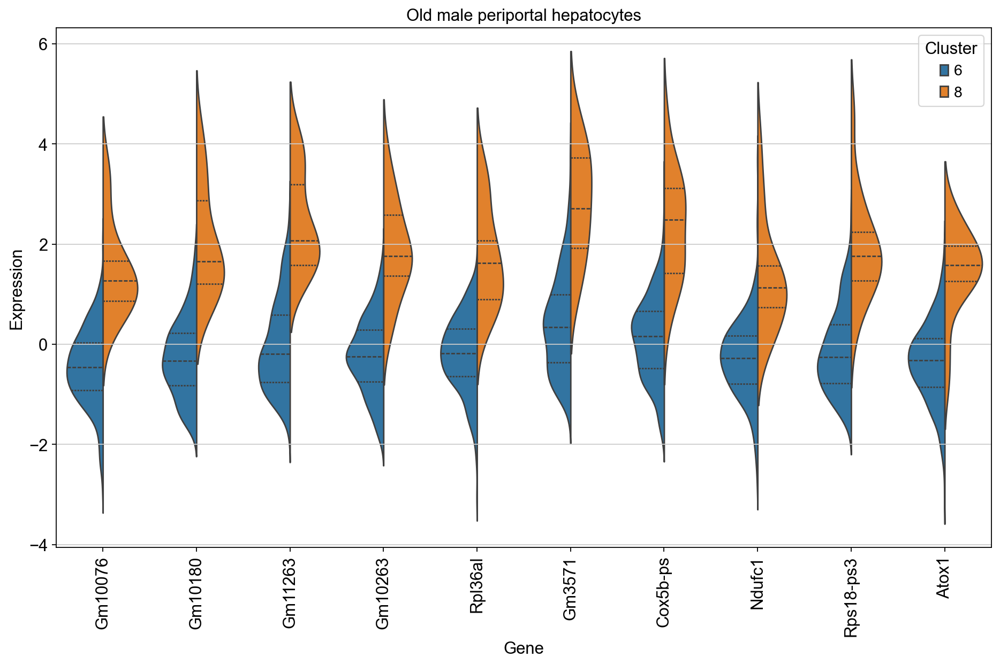

In [134]:
create_violin_plot(liver_ss3, ['8'], ['6'], "Old male periportal hepatocytes")

# Functional Enrichment Analysis

### Analyse old male pericentral hepatocytes against old male periportal hepatocytes

In [246]:
!pip install enrichrpy

In [ ]:
import pandas as pd
import enrichrpy


In [270]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['5'], reference='1', method='wilcoxon', use_raw=True)
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names


In [271]:
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names', 'scores', 'pvals', 'pvals_adj', 'logfoldchanges']}
)
padj_threshold = 0.05
logfc_threshold = 2
significant_genes = mop_degs[(mop_degs['5_pvals_adj'] < padj_threshold) & (mop_degs['5_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] < -logfc_threshold]



In [272]:
upregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] > logfc_threshold]['5_names'].tolist()
downregulated_genes = significant_genes[significant_genes['5_logfoldchanges'] < -logfc_threshold]['5_names'].tolist()

df_male_up = een.get_pathway_enrichment(upregulated_genes, gene_set_library='GO_Biological_Process_2021')
df_male_up



,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Old p-value,Old adjusted p-value
0,1,regulation of sequestering of triglyceride (GO...,0.000096,41.735294,386.316684,"[CIDEA, FITM1, PPARG]",0.072109,0,0
1,2,lipid droplet organization (GO:0034389),0.000313,26.349845,212.598294,"[CIDEA, FITM1, CIDEC]",0.072109,0,0
2,3,positive regulation of low-density lipoprotein...,0.000365,110.416667,874.122190,"[ANXA2, PPARG]",0.072109,0,0
3,4,L-aspartate transmembrane transport (GO:0070778),0.000365,110.416667,874.122190,"[SLC1A2, SLC1A4]",0.072109,0,0
4,5,monoterpenoid metabolic process (GO:0016098),0.000545,82.808333,622.313995,"[CYP1A2, CYP2E1]",0.078819,0,0
...,...,...,...,...,...,...,...,...,...
786,787,protein phosphorylation (GO:0006468),0.953724,0.323616,0.015333,[PDK4],0.958572,0,0
787,788,protein ubiquitination (GO:0016567),0.961428,0.305249,0.012007,[RNF43],0.965088,0,0
788,789,cytokine-mediated signaling pathway (GO:0019221),0.978931,0.256705,0.005466,[ANXA2],0.981412,0,0
789,790,regulation of transcription by RNA polymerase ...,0.985120,0.489365,0.007337,"[MYCN, TCF7, ESRRG, PPARG, AHR, TOX, TBX3]",0.986367,0,0


In [273]:
df_male_down = een.get_pathway_enrichment(downregulated_genes, gene_set_library='GO_Biological_Process_2021')
df_male_down

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Old p-value,Old adjusted p-value
0,1,isoleucine metabolic process (GO:0006549),0.000123,178.017857,1602.675494,"[SDS, SDSL]",0.025148,0,0
1,2,cellular amino acid catabolic process (GO:0009...,0.000135,17.102498,152.374271,"[HAL, SDS, GLS2, SDSL]",0.025148,0,0
2,3,regulation of lipid biosynthetic process (GO:0...,0.000142,33.937500,300.721049,"[HSD17B13, APOA4, PCK1]",0.025148,0,0
3,4,alpha-amino acid biosynthetic process (GO:1901...,0.000294,101.709184,827.202447,"[SDS, SDSL]",0.029709,0,0
4,5,regulation of Wnt signaling pathway (GO:0030111),0.000303,13.731395,111.263620,"[CTNNBIP1, ESR1, FGFR2, SULF2]",0.029709,0,0
...,...,...,...,...,...,...,...,...,...
527,528,positive regulation of cellular process (GO:00...,0.841831,0.543129,0.093514,[FGFR2],0.848208,0,0
528,529,regulation of apoptotic process (GO:0042981),0.888743,0.454601,0.053619,[GLS2],0.893783,0,0
529,530,regulation of cell population proliferation (G...,0.895890,0.440988,0.048481,[FGFR2],0.899270,0,0
530,531,cellular protein modification process (GO:0006...,0.952916,0.324116,0.015632,[CHRM3],0.954710,0,0


In [253]:
epl.enrichment_barplot(df_male_up, n=20)

alt.LayerChart(...)

In [254]:
epl.enrichment_dotplot(df_male_up, n=20, hue='Z-score', log=True)

alt.LayerChart(...)

In [255]:
epl.enrichment_barplot(df_male_down, n=20)

alt.LayerChart(...)

In [256]:
epl.enrichment_dotplot(df_male_down, n=20, hue='Z-score', log=True)

alt.LayerChart(...)

In [279]:
sc.tl.rank_genes_groups(liver_ss3, 'leiden', groups=['4'], reference='3', method='wilcoxon')
mop_res = liver_ss3.uns['rank_genes_groups']
groups = mop_res['names'].dtype.names
mop_degs = pd.DataFrame(
    {group + '_' + key: mop_res[key][group]
    for group in groups for key in ['names','scores', 'pvals','pvals_adj','logfoldchanges']})
mop_degs
padj_threshold = 0.05
logfc_threshold = 2

significant_genes = mop_degs[(mop_degs['4_pvals_adj'] < padj_threshold) & (mop_degs['4_logfoldchanges'].abs() > logfc_threshold)]

upregulated_genes = significant_genes[significant_genes['4_logfoldchanges'] > logfc_threshold]
downregulated_genes = significant_genes[significant_genes['4_logfoldchanges'] < -logfc_threshold]
upregulated_genes = significant_genes[significant_genes['4_logfoldchanges'] > logfc_threshold]['4_names'].tolist()
downregulated_genes = significant_genes[significant_genes['4_logfoldchanges'] < -logfc_threshold]['4_names'].tolist()

In [280]:
df_female_up = een.get_pathway_enrichment(upregulated_genes, gene_set_library='GO_Biological_Process_2021')
df_female_up


,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Old p-value,Old adjusted p-value
0,1,long-chain fatty acid metabolic process (GO:00...,0.000055,21.872317,214.563951,"[GSTM2, CYP1A2, ACOT1, CYP2E1]",0.009871,0,0
1,2,long-chain fatty acid biosynthetic process (GO...,0.000057,47.099291,460.346803,"[GSTM2, CYP1A2, CYP2E1]",0.009871,0,0
2,3,monoterpenoid metabolic process (GO:0016098),0.000091,207.770833,1932.575689,"[CYP1A2, CYP2E1]",0.009871,0,0
3,4,terpenoid metabolic process (GO:0006721),0.000128,166.208333,1490.324070,"[CYP1A2, CYP2E1]",0.009871,0,0
4,5,xenobiotic catabolic process (GO:0042178),0.000128,166.208333,1490.324070,"[GSTM3, GSTM2]",0.009871,0,0
...,...,...,...,...,...,...,...,...,...
443,444,"regulation of transcription, DNA-templated (GO...",0.827263,0.687500,0.130372,"[TCF7, SMAD6, CBFA2T3, TBX3]",0.834716,0,0
444,445,positive regulation of transcription by RNA po...,0.902319,0.428481,0.044042,[TBX3],0.908402,0,0
445,446,regulation of transcription by RNA polymerase ...,0.924810,0.514202,0.040194,"[TCF7, SMAD6, TBX3]",0.928957,0,0
446,447,regulation of gene expression (GO:0010468),0.937742,0.357275,0.022966,[TCF7],0.939840,0,0


In [281]:
df_female_down = een.get_pathway_enrichment(downregulated_genes, gene_set_library='GO_Biological_Process_2021')
df_female_down

,Rank,Term name,P-value,Z-score,Combined score,Overlapping genes,Adjusted p-value,Old p-value,Old adjusted p-value
0,1,steroid catabolic process (GO:0006706),3.604189e-07,302.545455,4488.563991,"[SULT1E1, SPP1, HSD17B6]",0.000090,0,0
1,2,epithelial cell differentiation (GO:0030855),1.556080e-04,33.811224,296.462578,"[BDH2, PCK1, FGFR2]",0.013562,0,0
2,3,ethanol metabolic process (GO:0006067),1.776296e-04,123.603715,1067.418236,"[ALDH1B1, SULT1E1]",0.013562,0,0
3,4,androgen metabolic process (GO:0008209),2.178659e-04,110.581717,932.384231,"[SPP1, HSD17B6]",0.013562,0,0
4,5,cellular response to ketone (GO:1901655),7.600546e-04,56.733997,407.470393,"[SPP1, PCK1]",0.033181,0,0
...,...,...,...,...,...,...,...,...,...
244,245,positive regulation of transcription by RNA po...,6.232668e-01,1.051378,0.497071,[FGFR2],0.633443,0,0
245,246,"negative regulation of transcription, DNA-temp...",6.395077e-01,1.004857,0.449228,[FGFR2],0.647307,0,0
246,247,cellular protein modification process (GO:0006...,6.689130e-01,0.925537,0.372160,[SPP1],0.674329,0,0
247,248,regulation of transcription by RNA polymerase ...,9.141863e-01,0.403039,0.036161,[FGFR2],0.917873,0,0


In [282]:
epl.enrichment_barplot(df_female_up, n=20)

alt.LayerChart(...)

In [283]:
epl.enrichment_dotplot(df_female_up, n=20, hue='Z-score', log=True)

alt.LayerChart(...)

In [284]:
epl.enrichment_barplot(df_female_down, n=20)

alt.LayerChart(...)

In [285]:
epl.enrichment_dotplot(df_female_down, n=20, hue='Z-score', log=True)

alt.LayerChart(...)